# HR Characterization and Unsupervised Anomaly Detection

Subject ID1, Charge 5 data

## Libraries

We will focus on HR data collected during sleep. We made this choice because it is far more likely that this data is a more reliable indicator of the health state or level of stress of the subject's organism, as it won't be influenced by daily activities, the intake of cafeine, etc.

In [37]:
# Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import seaborn as sns
from sklearn.preprocessing import StandardScaler
import plotly.express as px 
from hmmlearn.hmm import GaussianHMM, GMMHMM
import glob
from scipy.stats import linregress
#from IOHMM import UnSupervisedIOHMM
#from IOHMM import OLS, DiscreteMNL, CrossEntropyMNL

## 1. Data intake and preparation (Charge5 data)

Ddata collected by the FitBit Charge5 smartband.

### 1.1 Heart Rate brute data intake

In [2]:
import os
import json
import glob

#all_files = glob.glob("../Datos/full_charge5 id_1 v3/Physical Activity/heart_rate-2022*.json")
all_files = glob.glob("../Datos/data_charge5 id_1 v5/id_1/Physical Activity/heart_rate-202*.json")

hr = pd.concat((pd.read_json(f) for f in all_files), ignore_index=True)

# We have a dataframe with the HR data, but the dateTime column is a string. 
# We want to transform it into a datetime object.

hr['dateTime'] = pd.to_datetime(hr['dateTime'])
hr = hr.sort_values(by="dateTime")

# New column with the HR value.
hr['HR'] = hr['value'].apply(lambda x: x['bpm'])
hr['confidence'] = hr['value'].apply(lambda x: x['confidence'])



# Armonización de fechas

import pytz

# create a timezone object for Madrid, Spain
timezone_spain = pytz.timezone('Europe/Madrid')

# convert the dateTime column to timezone-aware timestamps in Spain
hr['dateTime'] = hr['dateTime'].apply(lambda x: x.replace(tzinfo=pytz.utc).astimezone(timezone_spain))

# Convert to timezone-naive object
hr['dateTime'] = hr['dateTime'].dt.tz_localize(None)



hr = hr.set_index('dateTime')
hr = hr.drop('value', axis=1)


hr.head(10)

,HR,confidence
dateTime,,
2022-06-02 15:01:53,70,0
2022-06-02 15:02:03,78,1
2022-06-02 15:02:08,81,2
2022-06-02 15:02:13,82,3
2022-06-02 15:02:18,82,2
2022-06-02 15:02:33,82,2
2022-06-02 15:02:48,82,2
2022-06-02 15:03:03,81,2
2022-06-02 15:03:08,80,2


Text(0.5, 0, 'Date')

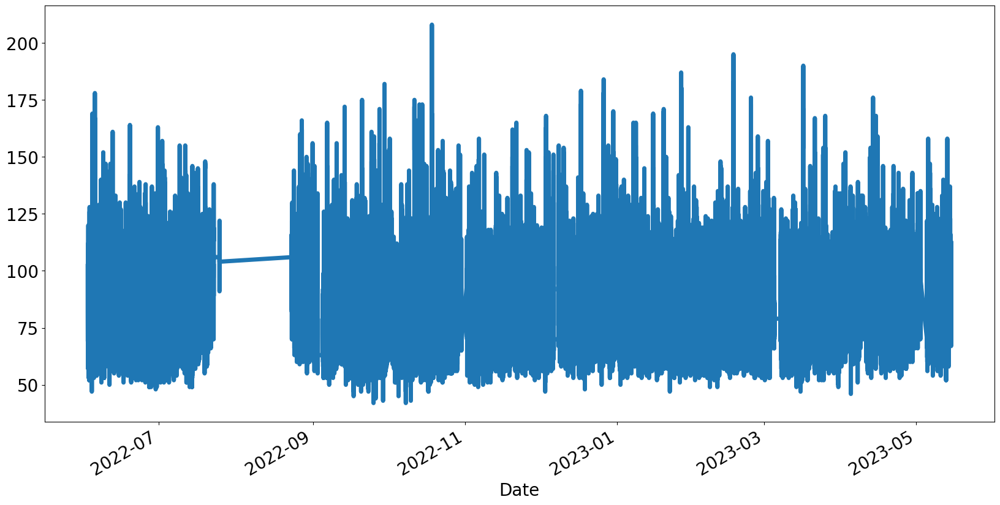

In [3]:
# HRV plot (rmssd)
# Plotly express is giving problems due to the large amount of observations so let's go more traditional
# (At least to see the full scope of measurements)

hr['HR'].plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Date', fontsize=20)

In [4]:
# Plot of HR (continuous measurement)

hr_selection = hr.loc['2022-06-20':'2022-06-25']
fig = px.line(hr_selection, x=hr_selection.index, y='HR', title='Heart Rate')
fig.update_yaxes(range=[0, hr_selection.HR.max()])
fig.show()

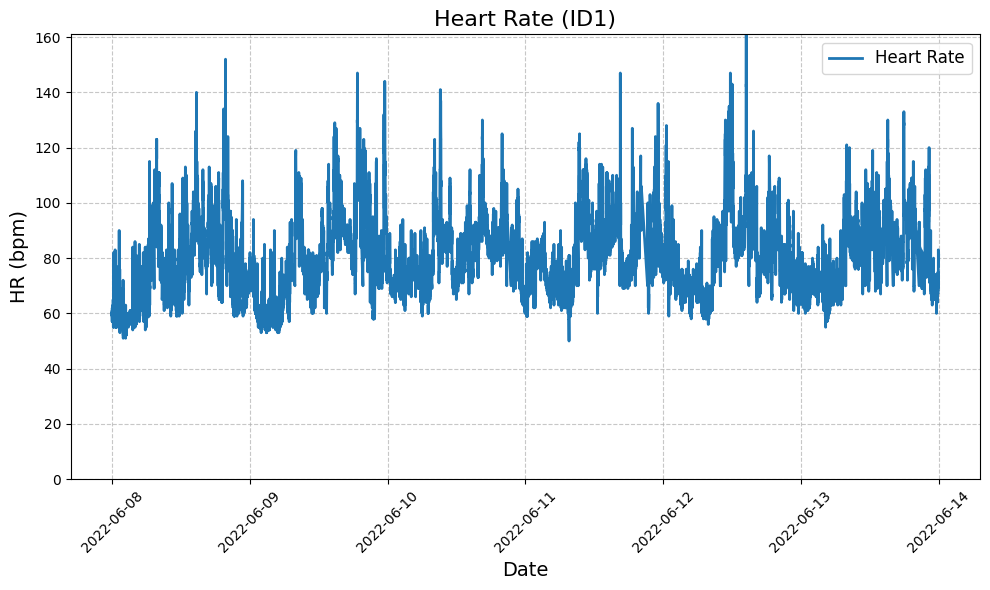

In [5]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Plot of HR (continuous measurement)
hr_selection = hr.loc['2022-06-08':'2022-06-13']

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(hr_selection.index, hr_selection['HR'], label='Heart Rate', linewidth=2)

# Set x-axis format and labels
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.xticks(rotation=45)

# Set y-axis range
ax.set_ylim([0, hr_selection.HR.max()])

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

# Set title and labels
ax.set_title('Heart Rate (ID1)', fontsize=16)
ax.set_xlabel('Date', fontsize=14)
ax.set_ylabel('HR (bpm)', fontsize=14)

# Add legend
ax.legend(loc='upper right', fontsize=12)

# Adjust plot layout for better appearance
plt.tight_layout()

# Save plot to a file (optional)
# plt.savefig('heart_rate_plot.png', dpi=300)

# Show plot
plt.show()


### 1.2 Resampling

In [6]:
def identify_long_time_periods_without_readings(df):
    
    processing_df = df.copy()
    processing_df['delta'] = processing_df.index.to_series().diff()
    
    end_time_periods = processing_df[processing_df['delta'] > pd.Timedelta(180, "seconds")].index
    initial_time_periods = end_time_periods - processing_df[processing_df['delta'] > pd.Timedelta(180, "seconds")]['delta']
    
    return [initial_time_periods, end_time_periods]

In [7]:
# hr_resampled = hr.resample('5S').mean().interpolate(method='spline', order=3)
# hr_resampled.head(10)

# Attempting a multiprocessing approach to improve the time it takes to perform this...

from joblib import Parallel, delayed
import multiprocessing

num_cores = multiprocessing.cpu_count() - 1  # (To avoid using all 8 of them for this single task...)

def process_chunk(chunk):
    # Resample and interpolate each chunk separately
    chunk_resampled = chunk.resample('5S').mean().interpolate(method='spline', order=3)
    return chunk_resampled

# Split your data into chunks
chunks = np.array_split(hr, num_cores)

# Use joblib to parallelize the computation
res = Parallel(n_jobs=num_cores)(delayed(process_chunk)(chunk) for chunk in chunks)

# Concatenate the results back into a single Series or DataFrame
hr_resampled = pd.concat(res)


In [8]:
initial_time_periods, end_time_periods = identify_long_time_periods_without_readings(hr)

In [9]:
# Drop all rows of hr_resampled in which its index datetime falls within these periods

for i, j in zip(initial_time_periods, end_time_periods):
    hr_resampled = hr_resampled.drop(hr_resampled[(hr_resampled.index > i) & (hr_resampled.index < j)].index)

In [10]:
hr_resampled.head(10)

,HR,confidence
dateTime,,
2022-06-02 15:01:50,70.000000,0.000000
2022-06-02 15:01:55,75.345216,2.087864
2022-06-02 15:02:00,78.000000,1.000000
2022-06-02 15:02:05,81.000000,2.000000
2022-06-02 15:02:10,82.000000,3.000000
2022-06-02 15:02:15,82.000000,2.000000
2022-06-02 15:02:20,82.490886,2.087861
2022-06-02 15:02:25,82.673007,2.087860
2022-06-02 15:02:30,82.000000,2.000000


In [11]:
hr_resampled.to_csv('../Datos/Clean/hr_charge5_id_1_v5_resampled-only.csv', index=True)

### 1.3 Reading of the sleep data

In [12]:
## Sleep data intake

all_files = glob.glob("../Datos/data_charge5 id_1 v5/id_1/Sleep/sleep-202*.json")

sleep = pd.concat((pd.read_json(f) for f in all_files), ignore_index=True)
sleep = pd.concat([pd.DataFrame(x) for x in sleep['levels'].apply(lambda x: x['data'])], ignore_index=True)

sleep['dateTime'] = pd.to_datetime(sleep['dateTime'])
sleep = sleep.sort_values(by="dateTime")
sleep = sleep.set_index('dateTime')

sleep.head(10)

,level,seconds
dateTime,,
2022-06-02 22:54:00,wake,480
2022-06-02 23:02:00,light,390
2022-06-02 23:08:30,deep,1230
2022-06-02 23:29:00,light,900
2022-06-02 23:44:00,rem,360
2022-06-02 23:50:00,light,540
2022-06-02 23:59:00,rem,1230
2022-06-03 00:19:30,light,2940
2022-06-03 01:08:30,deep,1770


In [13]:
sleep['start'] = sleep.index
sleep['end'] = sleep.index + pd.to_timedelta(sleep['seconds'], unit='s')

sleep.head(10)

,level,seconds,start,end
dateTime,,,,
2022-06-02 22:54:00,wake,480,2022-06-02 22:54:00,2022-06-02 23:02:00
2022-06-02 23:02:00,light,390,2022-06-02 23:02:00,2022-06-02 23:08:30
2022-06-02 23:08:30,deep,1230,2022-06-02 23:08:30,2022-06-02 23:29:00
2022-06-02 23:29:00,light,900,2022-06-02 23:29:00,2022-06-02 23:44:00
2022-06-02 23:44:00,rem,360,2022-06-02 23:44:00,2022-06-02 23:50:00
2022-06-02 23:50:00,light,540,2022-06-02 23:50:00,2022-06-02 23:59:00
2022-06-02 23:59:00,rem,1230,2022-06-02 23:59:00,2022-06-03 00:19:30
2022-06-03 00:19:30,light,2940,2022-06-03 00:19:30,2022-06-03 01:08:30
2022-06-03 01:08:30,deep,1770,2022-06-03 01:08:30,2022-06-03 01:38:00


### 1.4 Filtering of HR data not taken during night sleep

We will only consider NIGHT sleep (naps will be ignored) for purposes of making the hr data as comparable as possible between dates: same time period, same activity (this is, sleeping), no external influences other than acute episodes of anxiety (which are of direct relevance for the study anyways) and of course all relevant health events.

In [25]:
# Create an empty DataFrame to hold the filtered rows
filtered_hr_resampled = pd.DataFrame()

# Loop through the sleep dataframe
for i in range(len(sleep)):
    # Get the start and stop time for the ith row
    start = sleep.iloc[i]['start']
    stop = sleep.iloc[i]['end']
    # Filter the rows that fall within the corresponding time period
    if sleep.iloc[i]['level'] != 'wake':
        temp_df = hr_resampled.loc[start:stop]
        # Append the filtered rows to the new DataFrame
        filtered_hr_resampled = pd.concat([filtered_hr_resampled, temp_df])

# Reset the index of the new DataFrame
filtered_hr_resampled.reset_index(inplace=True)
filtered_hr_resampled = filtered_hr_resampled.set_index('dateTime')

filtered_hr_resampled.head(10)


,HR,confidence
dateTime,,
2022-06-02 23:02:00,57.000000,3.000000
2022-06-02 23:02:05,58.000000,3.000000
2022-06-02 23:02:10,57.000000,3.000000
2022-06-02 23:02:15,57.797659,2.083977
2022-06-02 23:02:20,58.000000,3.000000
2022-06-02 23:02:25,57.790553,2.083976
2022-06-02 23:02:30,57.797359,2.083975
2022-06-02 23:02:35,58.000000,3.000000
2022-06-02 23:02:40,57.823227,2.083974


In [26]:
hr_sleep = filtered_hr_resampled
hr_sleep = hr_sleep.drop(['confidence'], axis=1)
hr_sleep = hr_sleep.drop_duplicates()
hr_sleep.head(10)

,HR
dateTime,
2022-06-02 23:02:00,57.000000
2022-06-02 23:02:05,58.000000
2022-06-02 23:02:15,57.797659
2022-06-02 23:02:25,57.790553
2022-06-02 23:02:30,57.797359
2022-06-02 23:02:40,57.823227
2022-06-02 23:02:45,57.838906
2022-06-02 23:02:50,59.000000
2022-06-02 23:02:55,57.867292


Text(0.5, 0, 'Date')

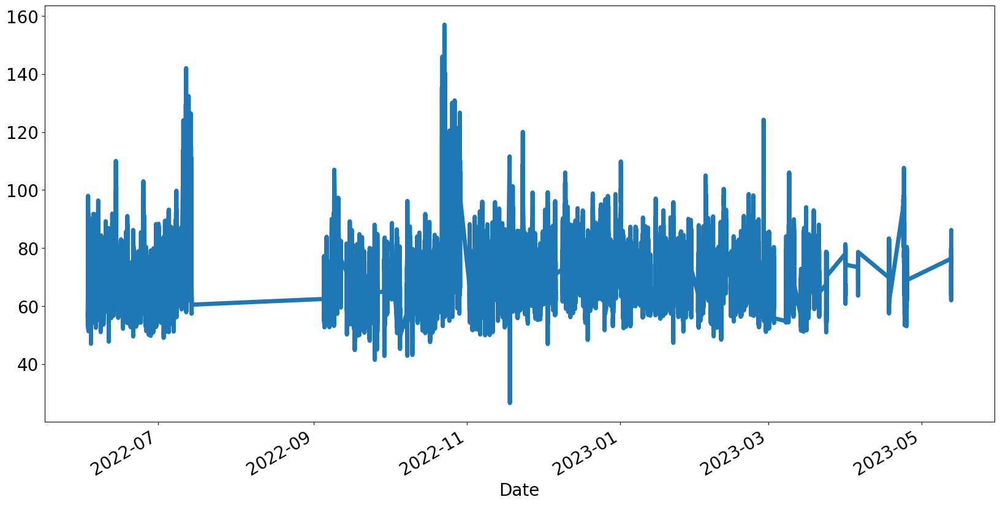

In [27]:
hr_sleep['HR'].plot(figsize=(20,10), linewidth=5, fontsize=20)
plt.xlabel('Date', fontsize=20)

In [28]:
hr_selection = hr_sleep.loc['2022-06-20':'2022-06-25']
fig = px.line(hr_selection, x=hr_selection.index, y='HR', title='Heart Rate')
fig.update_yaxes(range=[0, hr_selection.HR.max()])
fig.show()

## 2 Training the HMM model with heart rate measurements taken during the sleeping period

### 2.1 For the moment, we'll begin using a Gaussian emission model

In [38]:
# We first define a function to calculate the likelihood of the observed hr time series 
def calculate_likelihood(train, n_components, covariance_type='full', random_seed=None):
    """
    Function to calculate the likelihood of the observed hr time series for a given number of hidden states

    Args:
        train (pd.DataFrame): pandas dataframe containing the time series of hr measurements
        n_components (int): number of hidden states we want to assume when training the model
        covariance_type (str, optional): Covariance type of the hmm. Defaults to 'full'.

    Returns:
        float: likelihood score computed by the trained model
    
    """
    if random_seed is not None:
        np.random.seed(random_seed)
    
    #model = GaussianHMM(n_components=n_components, covariance_type=covariance_type)
    model = GMMHMM(n_components=n_components, covariance_type=covariance_type)
    model.fit(train)
    return model.score(train)

In [39]:
# Function to plot the log likelihood as a function of the number of hidden states
def plot_likelihood(train, n_components):
    """
    Function to plot the log likelihood as a function of the number of hidden states

    Args:
        train (pd.DataFrame): pandas dataframe containing the time series of hr measurements
        n_components (int): maximum number of hidden states we want to evaluate
    """
    components = range(1,n_components+1)
    likelihood = [calculate_likelihood(train, n, covariance_type='full', random_seed=123)
                   for n in components]
    plt.figure(figsize=(12,5))
    plt.plot(components, likelihood, label='likelihood')
    plt.legend(loc='best')
    plt.xlabel('n_components')
    plt.show()

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsose

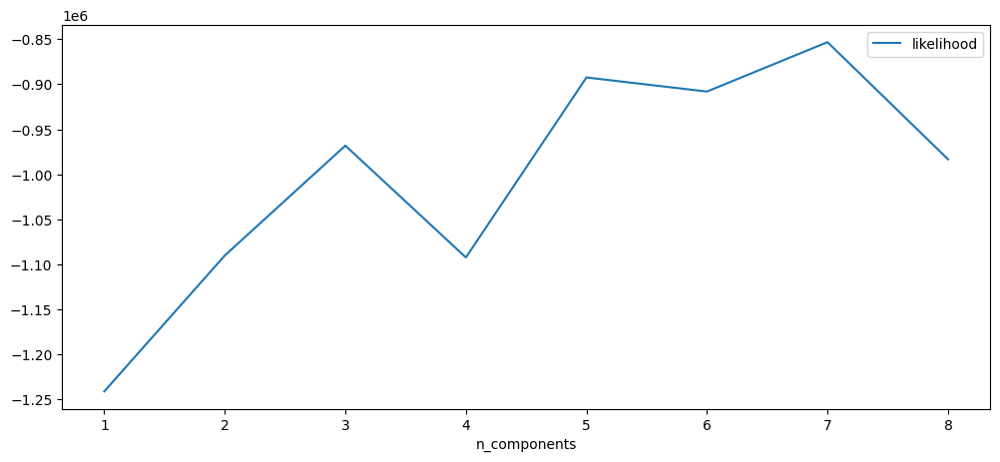

In [40]:
# Plot likelihoods
plot_likelihood(hr_sleep, 8)

In [41]:
np.random.seed(123)
#model = GaussianHMM(n_components = 5, covariance_type = 'full', n_iter = 10000).fit(hr_sleep)
model = GMMHMM(n_components = 5, covariance_type = 'full', n_iter = 10000).fit(hr_sleep)

# Predicting the state sequence
hidden_states = model.predict(hr_sleep)
posterior_probability = model.predict_proba(hr_sleep)  # Computation of posterior probabilities for each state

# Creating a dataframe with the hidden states
hr_sleep_hs = hr_sleep.copy()
hr_sleep_hs['hidden_states'] = hidden_states
hr_sleep_hs['p_prob_s0'] = posterior_probability[:,0]
hr_sleep_hs['p_prob_s1'] = posterior_probability[:,1]
hr_sleep_hs['p_prob_s2'] = posterior_probability[:,2]
hr_sleep_hs['p_prob_s3'] = posterior_probability[:,3]
hr_sleep_hs['p_prob_s4'] = posterior_probability[:,4]
hr_sleep_hs.head()

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Users/alfonsose

,HR,hidden_states,p_prob_s0,p_prob_s1,p_prob_s2,p_prob_s3,p_prob_s4
dateTime,,,,,,,
2022-06-02 23:02:00,57.000000,3,0.000000e+00,0.000000e+00,0.000000e+00,1.0,0.000000e+00
2022-06-02 23:02:05,58.000000,3,3.174275e-07,3.742640e-18,8.530875e-11,1.0,9.391542e-23
2022-06-02 23:02:15,57.797659,3,2.193804e-07,1.588657e-18,7.955897e-11,1.0,4.216738e-23
2022-06-02 23:02:25,57.790553,3,2.164416e-07,1.541056e-18,7.936553e-11,1.0,4.099414e-23
2022-06-02 23:02:30,57.797359,3,2.191852e-07,1.586393e-18,7.954802e-11,1.0,4.211646e-23


In [42]:
# Plotting each state's posterior probabilities
hr_selection = hr_sleep_hs.loc['2022-9-16 1:00:00':'2022-9-18 5:30:00']
fig = px.line(hr_selection[['p_prob_s0', 'p_prob_s1', 'p_prob_s2', 'p_prob_s3', 'p_prob_s4']], title="Posterior probabilities")
fig.show()

In [43]:
# Plot of HR (continuous measurement)

hr_selection = hr_sleep.loc['2022-9-16 1:00:00':'2022-9-16 5:30:00']
fig = px.line(hr_selection, x=hr_selection.index, y='HR', title='Heart Rate')
fig.update_yaxes(range=[0, hr_selection.HR.max()])
fig.show()

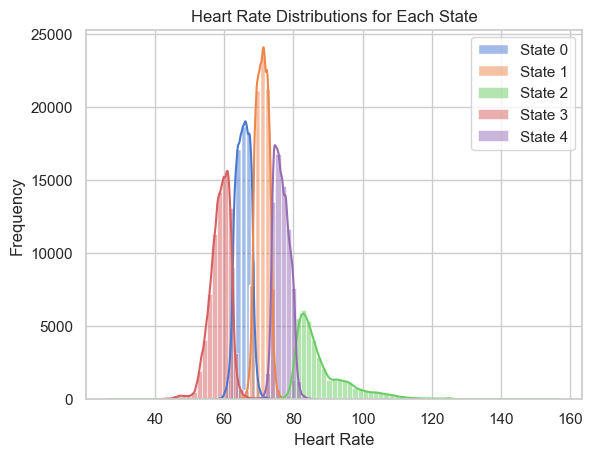

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the Seaborn style for the plots
sns.set(style='whitegrid', palette='muted')

# Define the constant bin width
bin_width = 1.5

# Create a superimposed histogram of the HR distributions for each state
for i in range(5):
    sns.histplot(data=hr_sleep_hs[hr_sleep_hs['hidden_states'] == i], x='HR', label=f'State {i}', binwidth=bin_width, alpha=0.5, kde=True)

# Add labels and title
plt.xlabel('Heart Rate')
plt.ylabel('Frequency')
plt.title('Heart Rate Distributions for Each State')
plt.legend()

# Show the plot
plt.show()


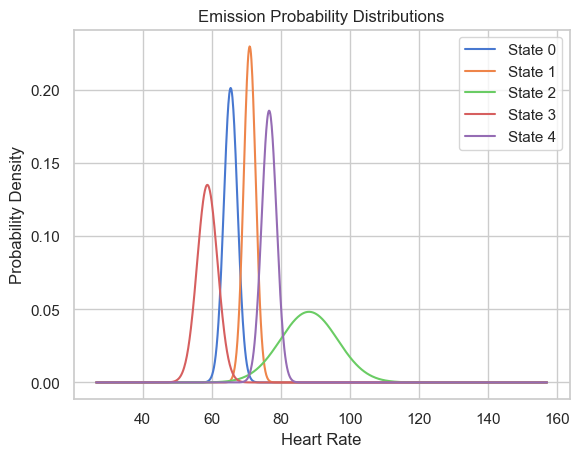

In [45]:
import numpy as np

# Extract the GMMHMM model parameters
means = model.means_
covariances = model.covars_
weights = model.weights_

# Create a function to calculate the Gaussian probability density function
def gaussian_pdf(x, mean, cov):
    return (1.0 / (np.sqrt(2 * np.pi * cov))) * np.exp(-((x - mean) ** 2) / (2 * cov))

# Plot the emission probability distribution for each state
x_range = np.linspace(hr_sleep_hs['HR'].min(), hr_sleep_hs['HR'].max(), 1000)
for i in range(5):
    y_values = np.squeeze(np.sum([weights[i, k] * gaussian_pdf(x_range, means[i, k], covariances[i, k]) for k in range(means.shape[1])], axis=0))
    plt.plot(x_range, y_values, label=f'State {i}')

plt.xlabel('Heart Rate')
plt.ylabel('Probability Density')
plt.title('Emission Probability Distributions')
plt.legend()
plt.show()


In [46]:
def nearest(items, pivot):
    return min(items, key=lambda x: abs(x - pivot))

In [47]:
## Scoring

def calcultate_likelihoods(dataset, model, window=8, step=8):

    # Initialize the dataframe to store the likelihoods
    likelihoods = pd.DataFrame(columns=['date', 'likelihood'])
    
    # Initialize the train and test windows
    window_start = dataset.index[0]
    window_end = window_start + pd.Timedelta(window, unit='h')
    
    # Initialize the counter
    counter = 0
    
    # Loop through the dataset
    while window_end <= dataset.index[-1]:

        # Get the likelihood of the test window
        nearest_window_start = nearest(dataset.index,window_start)
        nearest_window_end = nearest(dataset.index,window_end)
        if len(dataset.loc[nearest_window_start:nearest_window_end]) > 0:
            likelihood = model.score(dataset.loc[nearest_window_start:nearest_window_end])
        else:
            likelihood = 0
        
        # Store the likelihood in the dataframe
        likelihoods.loc[counter, 'date'] = window_start
        likelihoods.loc[counter, 'likelihood'] = likelihood
        
        # Move the evaluation window
        window_start = window_start + pd.Timedelta(step, unit='h')
        window_end = window_end + pd.Timedelta(step, unit='h')
        
        # Increase the counter
        counter += 1
        
    # Set date column as the index
    likelihoods = likelihoods.set_index('date')
    # Return the dataframe with the likelihoods
    return likelihoods



In [56]:
#hr_sleep_test = hr_sleep['2022-10-01':'2022-12-01']
likelihoods_4h_slices = calcultate_likelihoods(hr_sleep, model, window=1, step=1)
fig = px.line(likelihoods_4h_slices, x=likelihoods_4h_slices.index, y='likelihood', title='Likelihood of observation')
fig.show()

In [ ]:
likelihoods_4h_slices.head(5)

,likelihood
date,
2022-06-03 00:19:30,-2692.899118
2022-06-03 04:19:30,-952.381359
2022-06-03 08:19:30,-2.646654
2022-06-03 12:19:30,-7.797421
2022-06-03 16:19:30,-5.461678


In [ ]:
import numpy as np

peaks = [2692.8, 1900.4, 1984.3, 1937.1, 2933.4, 2298.7, 2187.7, 2262.2, 2150.2, 1730.0, 1768.8, 3099.8, 2079.6, 2573.0,
         1715.7, 1553.7, 2603.2, 2296.2, 2179.7, 2099.9, 2359.6, 2804.4, 2815.2, 2409.9, 2367.8, 1840.0, 2073.7, 2339.8,
         1914.3, 1818.4, 1757.6, 2396.7, 2247.1, 1879.8, 2419.9, 1398.1, 2328.4, 3936.3, 1826.8, 3347.6, 2352.3, 2445.0,
         2446.1, 2064.7, 1696.6, 2532.9, 2138.5, 2281.4, 2142.0, 2591.2, 1108.9, 1631.4, 2390.6, 2143.0, 1836.3, 1493.4,
         754.1, 3713.6, 3001.7, 1737.6, 1324.8, 2026.4, 2269.6, 2289.1, 1663.0, 2284.7, 1870.0, 2210.9, 2106.8, 1557.2,
         1627.1, 2210.1, 2158.8, 2646.1, 1735.3, 3078.1, 3691.24, 3304.7, 3866.5, 3785.7, 3867.5, 3422.5, 2871.1, 2328.6,
         2074.6, 2481.9, 1873.1, 2003.4, 3102.1, 2223.6, 2053.4, 2512.0, 2062.1, 2701.0, 2548.4, 2439.4, 2432.3, 1239.9,
         2087.6, 1869.5, 2228.0, 2133.2, 2166.8, 2910.8, 2262.0, 2395.0, 2355.0, 2801.9, 2117.6, 1887.7]

# Calculate the standard deviation
std_dev = np.std(peaks)

# COmpute threshold value
threshold = np.mean(peaks) + 3 * std_dev

print("Anomaly threshold (three times the standard deviation above the mean):", threshold)

Anomaly threshold (three times the standard deviation above the mean): 4043.8569027828316


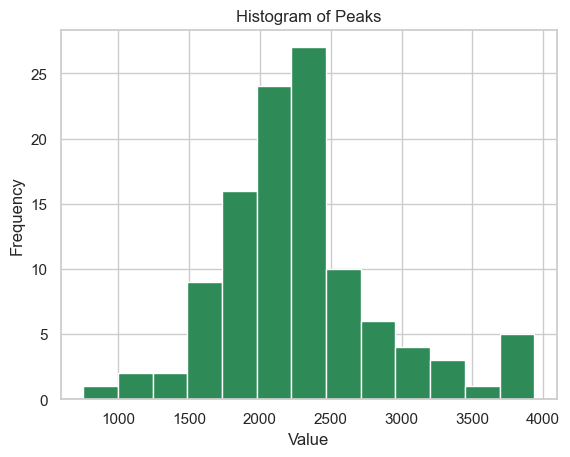

In [ ]:
import matplotlib.pyplot as plt

plt.hist(peaks, bins='auto',color='seagreen')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Histogram of Peaks')
plt.show()

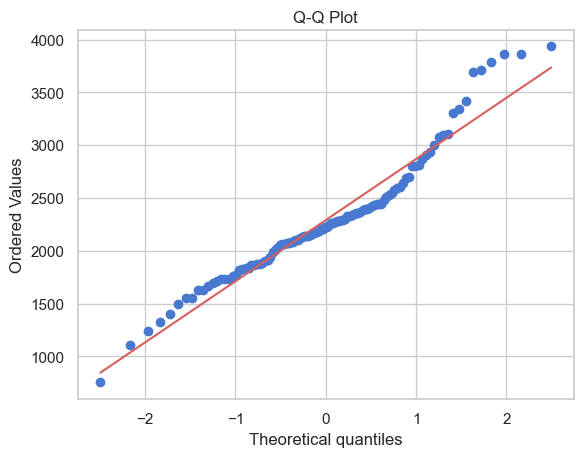

In [ ]:
import numpy as np
import scipy.stats as stats
import matplotlib.pyplot as plt

stats.probplot(peaks, dist="norm", plot=plt)
plt.title('Q-Q Plot')
plt.show()

In [ ]:
from scipy.stats import shapiro

stat, p_value = shapiro(peaks)
print(f'Statistics={stat:.3f}, p={p_value:.3f}')

alpha = 0.05
if p_value > alpha:
    print('Sample looks Gaussian (fail to reject H0)')
else:
    print('Sample does not look Gaussian (reject H0)')

Statistics=0.948, p=0.000
Sample does not look Gaussian (reject H0)


In [ ]:
import numpy as np

threshold_quantile = 0.9  # 90th percentile
threshold = np.quantile(peaks, threshold_quantile)

print("Anomaly threshold (90th percentile):", threshold)

Anomaly threshold (90th percentile): 3080.27


In [ ]:
import numpy as np

Q1 = np.quantile(peaks, 0.25)
Q3 = np.quantile(peaks, 0.75)
IQR = Q3 - Q1

# Define the multiplier for the IQR (1.5 is commonly used)
multiplier = 1.5
threshold = Q3 + multiplier * IQR

print("Anomaly threshold (using inter-quartile range):", threshold)

Anomaly threshold (using inter-quartile range): 3405.375


In [ ]:
likelihoods = calcultate_likelihoods(hr_sleep, model, window=1, step=1)

In [ ]:
# likelihoods = calcultate_likelihoods(hr_sleep, model, window=1, step=1)
fig = px.line(likelihoods, x=likelihoods.index, y='likelihood', title='Likelihood of observation')
fig.show()

In [ ]:
import numpy as np

peaks = [809.8, 621.4, 617.1, 536.0, 927.9, 696.9, 661.9, 621.2, 866.1, 736.3, 635.8, 954.3, 596.8, 841.7, 640.0, 930.9,
         744.9, 736.3, 668.7, 590.1, 663.9, 956.4, 958.0, 655.4, 862.6, 646.7, 632.0, 706.5, 642.5, 672.5, 634.7, 703.3,
         613.1, 589.8, 932.2, 548.6, 957.6, 1271.0, 1012.6, 1173.6, 762.8, 700.6, 680.5, 726.5, 943.6, 1061.5, 730.7, 727.4,
         647.9, 991.7, 807.8, 489.7, 712.6, 655.9, 1123.1, 497.2, 535.6, 2365.6, 1031.7, 700.1, 925.3, 737.2, 711.2, 966.6,
         629.1, 945.8, 657.6, 604.6, 595.4, 478.5, 599.3, 664.1, 686.9, 783.7, 650.8, 1032.5, 1097.4, 1078.2, 1456.5, 1444.9,
         1149.2, 1048.1, 1096.4, 679.9, 581.9, 718.9, 649.4, 778.5, 1224.7, 765.1, 690.3, 676.6, 700.6, 850.4, 743.2, 760.6,
         681.2, 621.7, 632.4, 672.0, 855.3, 613.5, 607.7, 1192.2, 611.0, 859.4, 666.4, 814.8, 568.3, 640.6]

# Calculate the standard deviation
std_dev = np.std(peaks)

# COmpute threshold value
threshold = np.mean(peaks) + 3 * std_dev

print("Anomaly threshold (three times the standard deviation above the mean):", threshold)

Anomaly threshold (three times the standard deviation above the mean): 1540.0968358176033


In [ ]:
import numpy as np

threshold_quantile = 0.9  # 90th percentile
threshold = np.quantile(peaks, threshold_quantile)

print("Anomaly threshold (90th percentile):", threshold)

Anomaly threshold (90th percentile): 1080.0200000000002


In [ ]:
# Plotting HR selection
hr_sleep_selection = hr_sleep['2022-10-15':'2022-11-07']
fig = px.line(hr_sleep_selection['HR'], title = "Heart rate")
fig.show()

Viaje a Australia (desajuste horario implica peor calidad de sueño, más tiempo despierto). Probar a filtrar.

Clustering de características de series temporales. O clustering de las series tempoorales propiamente dichas. O clustering de la función de autocorrelación y autocorrelación parcial.

Para semana que viene:

Traer una especie de guión en sucio de la presentación y una planificación de actividades a enseñar. En cuanto a código, probar MLP y mirar clustering de series temporales a ver si hay algo interesante. También prubeas iniciales de la app.

### Caracterización de los estados HMM

In [ ]:
# First, convert the 'start' and 'stop' columns in the sleep dataset to datetime
sleep['start'] = pd.to_datetime(sleep['start'])
sleep['end'] = pd.to_datetime(sleep['end'])

# Assign sleep stage to each observation in hr_sleep_hs
# Initialize an empty list to store the sleep stage for each observation in hr_sleep_hs
sleep_stages = []

# Iterate through the rows of hr_sleep_hs
for idx, row in hr_sleep_hs.iterrows():
    # Find the sleep stage corresponding to the current observation's timestamp
    stage = sleep[(sleep['start'] <= idx) & (sleep['end'] > idx)]['level']
    
    if not stage.empty:
        sleep_stages.append(stage.iloc[0])
    else:
        sleep_stages.append(None)

# Add the sleep stages to the hr_sleep_hs dataset
hr_sleep_hs['sleep_stage'] = sleep_stages

# Group the hr_sleep_hs dataset by hidden state and sleep stage
grouped_df = hr_sleep_hs.groupby(['hidden_states', 'sleep_stage']).size().reset_index(name='count')

# Count the number of observations in each group and compute the percentage of observations belonging to each sleep stage within each hidden state
total_counts = grouped_df.groupby('hidden_states')['count'].transform('sum')
grouped_df['percentage'] = (grouped_df['count'] / total_counts) * 100

# Pivot the dataframe to show the results in a more readable format
pivot_df = grouped_df.pivot_table(index='hidden_states', columns='sleep_stage', values='percentage')
pivot_df.fillna(0, inplace=True)

print("Percentage of observations in each sleep stage within each hidden state:")
print(pivot_df)


Percentage of observations in each sleep stage within each hidden state:
sleep_stage      asleep       deep      light        rem  restless       wake
hidden_states                                                                
0              0.279733  14.807796  68.841364  10.837394  0.015039   5.218673
1              0.199029  12.070952  67.006530  13.949509  0.087294   6.686686
2              1.078582  16.525424  56.747560  11.138932  0.000000  14.509502
3              0.280770  18.315377  58.230493  17.224943  0.029383   5.919034
4              1.078516  26.781708  48.403796  15.983607  0.012942   7.739431


In [ ]:
# Count the number of occurrences for each sleep stage
sleep_stage_counts = merged_sleep_hs_df['level'].value_counts()

# Calculate the total number of observations
total_observations = len(merged_sleep_hs_df)

# Compute the percentage for each sleep stage
sleep_stage_percentages = (sleep_stage_counts / total_observations) * 100

print("Percentages of observations for each sleep stage:")
print(sleep_stage_percentages)


Percentages of observations for each sleep stage:
light       0.156900
rem         0.079212
deep        0.069310
wake        0.064740
asleep      0.000762
restless    0.000762
Name: level, dtype: float64


In [ ]:
import pandas as pd

# Filter the likelihoods_4h_slices dataset to only include time segments with a log likelihood greater than 3080.27
high_likelihood_segments = likelihoods_4h_slices[likelihoods_4h_slices['likelihood'] < -3080.27]

# Initialize an empty DataFrame to store the filtered hr_sleep_hs observations
filtered_hr_sleep_hs = pd.DataFrame()

# Iterate through the rows of high_likelihood_segments
for idx, row in high_likelihood_segments.iterrows():
    # Define the start and end times of the current time segment
    start_time = idx
    end_time = idx + pd.Timedelta(hours=4)

    # Filter the hr_sleep_hs dataset to only include observations within the current time segment
    segment_data = hr_sleep_hs.loc[start_time:end_time]

    # Append the filtered observations to the filtered_hr_sleep_hs DataFrame
    filtered_hr_sleep_hs = filtered_hr_sleep_hs.append(segment_data)

filtered_hr_sleep_hs.drop_duplicates()

# Group the filtered_hr_sleep_hs dataset by hidden state
grouped_df = filtered_hr_sleep_hs.groupby('hidden_states').size().reset_index(name='count')

# Compute the percentage of observations belonging to each hidden state
total_counts = grouped_df['count'].sum()
grouped_df['percentage'] = (grouped_df['count'] / total_counts) * 100
grouped_df = grouped_df.set_index(['hidden_states'])

print("Count and percentage of observations for each hidden state in anomalous observations:")
print(grouped_df)


Count and percentage of observations for each hidden state in anomalous observations:
               count  percentage
hidden_states                   
0                548    4.457822
1               1392   11.323517
2               4841   39.380135
3               2057   16.733100
4               3455   28.105426


/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_24075/3335187954.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_24075/3335187954.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_24075/3335187954.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_24075/3335187954.py:19: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_24075/3335187954.py:19: FutureWarning:

The frame.append method is de

In [ ]:
# Group the hr_sleep_hs dataset by hidden state
global_grouped_df = hr_sleep_hs.groupby('hidden_states').size().reset_index(name='count')

# Compute the percentage of observations belonging to each hidden state
global_total_counts = global_grouped_df['count'].sum()
global_grouped_df['percentage'] = (global_grouped_df['count'] / global_total_counts) * 100
global_grouped_df = global_grouped_df.set_index(['hidden_states'])

print("Global count and percentage of observations for each hidden state:")
print(global_grouped_df)


Global count and percentage of observations for each hidden state:
               count  percentage
hidden_states                   
0              33247   25.326609
1              28639   21.816367
2              15576   11.865349
3              30631   23.333816
4              23180   17.657858


## 3. Time series clustering

### 3.1 Feature extraction

Though there are several possible approaches for the clustering of a given set of time series, we have decided to follow what we regarded as the best and most simple option: we will define a set of features or variables xi, where xi ∈ R, for the ith series that summarize its properties and use these vectors of variables to perform grouping. Note that for each time series we will have a summary vector, and we will be clustering these vectors (not the time series themselves).

But first of all, we have to split the dataframe into segments that can be treated as separate time series.

In [ ]:
def segment_time_series(time_series_df, column_name, time_threshold):
    """
    This function segments a large time series dataframe into smaller segments based on a time threshold.
    It fragments the dataframe each time there is more than the time threshold of separation between
    one observation and the next.
    
    Parameters:
    time_series_df: pandas DataFrame, the input time series dataframe
    column_name: str, the name of the column in the dataframe that contains the time series data
    time_threshold: pd.Timedelta, the time threshold to determine when to fragment the dataframe
    
    Returns:
    list of pandas DataFrames, the segments of the original time series
    """
    segments = []
    segment = pd.DataFrame(columns=[column_name])
    time_diff = time_series_df.index[1] - time_series_df.index[0]
    
    for i in range(len(time_series_df)):
        segment = pd.concat([segment, time_series_df.iloc[i, :].to_frame().T])
        
        if i < len(time_series_df) - 1:
            time_diff = time_series_df.index[i+1] - time_series_df.index[i]
            
            if time_diff > time_threshold:
                segments.append(segment)
                segment = pd.DataFrame(columns=[column_name])
    
    segments.append(segment)
    
    return segments

In [ ]:
def segment_time_series_checking_minimum_segment_size(time_series_df, column_name, time_threshold):
    """
    Esta función segmenta un dataframe de series temporales grande en segmentos más pequeños según un umbral de tiempo.
    Fragmenta el dataframe cada vez que hay más del umbral de tiempo de separación entre una observación y la siguiente.
    
    Parámetros:
    time_series_df: pandas DataFrame, el dataframe de la serie temporal de entrada
    column_name: str, el nombre de la columna en el dataframe que contiene los datos de la serie temporal
    time_threshold: pd.Timedelta, el umbral de tiempo para determinar cuándo fragmentar el dataframe
    
    Devuelve:
    lista de pandas DataFrames, los segmentos de la serie temporal original
    """
    segments = []
    segment = pd.DataFrame(columns=[column_name])
    time_diff = time_series_df.index[1] - time_series_df.index[0]
    
    for i in range(len(time_series_df)):
        segment = pd.concat([segment, time_series_df.iloc[i, :].to_frame().T])
        
        if i < len(time_series_df) - 1:
            time_diff = time_series_df.index[i+1] - time_series_df.index[i]
            
            if time_diff > time_threshold:
                if len(segment) >= 10:
                    segments.append(segment)
                segment = pd.DataFrame(columns=[column_name])
    
    if len(segment) >= 10:
        segments.append(segment)
    
    return segments


In [ ]:
column_name = "HR"
time_threshold = pd.Timedelta(minutes=30)

segments = segment_time_series_checking_minimum_segment_size(hr_sleep, column_name, time_threshold)

Now let's move to the feature extraction process.

In [ ]:
import numpy as np
import tsfresh
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from tsfresh.feature_extraction import feature_calculators

# Preprocess the data
def get_key_features(time_series):
    """
    This function computes a set of time-based, frequency-based, and time-frequency representation features
    from a time series using tsfresh library. The computed features are:
    - mean absolute change: the mean absolute difference between consecutive time series values
    - variance larger than standard deviation: ratio of variance to standard deviation, a measure of dispersion
    - coefficient of variation: the ratio of the standard deviation to the mean, a measure of variability
    - autocorrelation: the correlation of a time series with a delayed copy of itself
    - energy ratio by chunks: ratio of energy of the time series within each chunk of the series to the total energy of the series
    - spectral centroid: the weighted mean of the frequencies present in the spectrum, a measure of the "center of mass" of the frequencies present in the time series.
    
    Parameters:
    time_series: np.array, the input time series
    
    Returns:
    np.array, the extracted features
    """
    # Converting to numpy array:
    time_series_array = time_series.values.flatten()

    # We compute the slope of the regression line
    x = np.arange(len(time_series_array))
    slope, _, _, _, _ = linregress(x, time_series_array)

    features = [
        time_series.mean()[0],
        time_series.std()[0],
        time_series.median()[0],
        slope,
        #feature_calculators.mean_abs_change(time_series.values),
        feature_calculators.number_crossing_m(time_series_array, time_series.median()[0]),
        #feature_calculators.variance_larger_than_standard_deviation(time_series.values),
        #feature_calculators.cid_ce(time_series.values, normalize=False),
        feature_calculators.autocorrelation(time_series_array, lag=1),
        feature_calculators.sample_entropy(time_series_array),
        feature_calculators.skewness(time_series_array),
        feature_calculators.abs_energy(time_series_array),
        #feature_calculators.energy_ratio_by_chunks(time_series.values, param=[{"num_segments": 10, "segment_focus": 1}]),  #num_segments=10
        #feature_calculators.fft_aggregated(time_series.values, param=[{"aggtype": "centroid"}]),
        time_series.index[0]
    ]
    return features


In [ ]:
time_series_features = np.array([get_key_features(ts) for ts in segments])

# Convert to Pandas DataFrame
ts_features_df = pd.DataFrame(data=time_series_features, columns=["mean", "Std Deviation", "median", "slope", "number of median crossings", "autocorrelation", "sample entropy", "skewness", "abs energy", "datetime"])  #  "cid_ce", "datetime", "spectral centroid", "energy ratio"
ts_features_df.set_index('datetime', inplace=True)
ts_features_df.head(10)

,mean,Std Deviation,median,slope,number of median crossings,autocorrelation,sample entropy,skewness,abs energy
datetime,,,,,,,,,
2022-06-03 00:19:30,65.514126,8.623345,64.316739,-0.0107,54,0.958672,0.304252,0.552127,6174104.096664
2022-06-04 00:52:30,65.920995,3.263816,65.953768,-0.001774,88,0.899179,0.498303,-0.560022,5101134.735861
2022-06-05 00:50:30,67.679184,8.299045,66.370229,0.01896,45,0.965393,0.298248,0.916444,5118861.1095
2022-06-06 00:18:30,66.558373,4.262653,67.701009,0.000385,126,0.854795,0.655699,-0.478925,4657233.896279
2022-06-07 00:01:00,77.407906,9.939639,75.206068,-0.015403,47,0.96696,0.327231,1.018282,7479379.431627
2022-06-08 00:15:50,60.300494,4.799415,58.726615,0.002998,96,0.894066,0.292777,1.092062,4376360.970901
2022-06-09 00:38:00,60.165771,5.920755,58.364218,-0.00338,93,0.898735,0.31382,2.345615,4206841.566885
2022-06-10 00:16:00,73.186382,3.450978,73.358625,0.002122,98,0.918341,0.451388,-0.180503,7075217.311069
2022-06-11 01:19:20,75.640045,6.020375,74.451865,-0.011708,45,0.968792,0.30538,0.074276,6028235.091237


### 3.2 Clustering via k-means algorythm

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
train_df, test_df = train_test_split(ts_features_df, test_size=0.2, random_state=0)

# Standardize the features
scaler = StandardScaler()
train_df_scaled = scaler.fit_transform(train_df)
test_df_scaled = scaler.transform(test_df)

In [ ]:
# Find the optimal number of clusters
from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=500, n_init=10, random_state=0)
    kmeans.fit(train_df_scaled)
    wcss.append(kmeans.inertia_)

fig = px.line(x=list(range(1, 11)), y=wcss, title='Elbow Method')
fig.update_layout(xaxis_title='Number of Clusters', yaxis_title='WCSS')
fig.show()

In [ ]:
optimal_k = 5

# Initialize k-means
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=300, n_init=10, random_state=0)
kmeans.fit(train_df_scaled)

train_df['cluster'] = kmeans.labels_
centroids = kmeans.cluster_centers_
centroids_df = pd.DataFrame(centroids, columns=train_df.columns[:-1])
print(centroids_df)



       mean  Std Deviation    median  number of median crossings  \
0  0.022289      -0.092088  0.107511                   -0.298013   
1 -1.026852      -0.732584 -0.963456                    0.643784   
2 -0.492472       0.572163 -0.671851                    0.826291   
3  1.649237      -1.942266  1.655784                   -2.137063   
4  1.705809       0.733761  1.621159                   -0.786072   

   autocorrelation  sample entropy  skewness  abs energy  
0         0.323890        0.304135 -0.435730   -0.028442  
1        -0.966937        0.249598 -0.133084   -0.767620  
2         0.177835       -1.436366  1.357632   -0.238251  
3        -3.948001        1.097144  0.225427   -2.405889  
4         0.678850        0.604617 -0.466775    1.786972  


In [ ]:
# Assign the observations of the test dataset to the appropriate cluster
test_df['cluster'] = kmeans.predict(test_df_scaled)

In [ ]:
# Visualize the clustering using plotly

import plotly.express as px
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
train_df_pca = pca.fit_transform(train_df_scaled)

fig = px.scatter_3d(train_df, x=train_df_pca[:,0], y=train_df_pca[:,1], z=train_df_pca[:,2], color='cluster', 
                    hover_name="cluster", hover_data=[train_df.index, "mean"])  # , text=train_df.index
fig.show()


In [ ]:
# Plotting HR selection
hr_sleep_selection = hr_sleep['2022-9-1':'2022-10-04']
fig = px.line(hr_sleep_selection['HR'])
fig.show()

## 4. Exploring other approaches

### 4.1 Autoencoders

Autoencoders are a type of neural network that are used for dimensionality reduction, denoising, and anomaly detection. The basic idea behind autoencoders is to train a neural network to reconstruct its input, such that the difference between the input and the reconstructed output is minimized. In other words, an autoencoder learns to compress and decompress the input data.

An autoencoder consists of two parts: an ``encoder`` and a ``decoder``. The *encoder* ``maps`` the input data to a ``lower-dimensional representation``, called the ``encoding or latent representation``, while the *decoder* ``maps`` the encoding back to the ``original space``. The goal is to train the autoencoder such that the encoding is a compact representation of the input data, and the decoder is able to reconstruct the input from the encoding with minimal loss.

In the context of anomaly detection, the autoencoder is trained on normal data, and the ``reconstruction error`` is used as a measure of deviation from normality. Data points with high reconstruction error are considered anomalies.

Regarding the architecture of the autoencoder, Dense layers can be used to build the autoencoder. Dense layers are fully connected layers that connect all the neurons in the previous layer to all the neurons in the current layer. When building an autoencoder, the Dense layers are typically used in a symmetrical fashion, such that the encoder has the same number of layers and neurons as the decoder, but with a smaller latent representation.

It's worth noting that there are other types of layers that can be used to build autoencoders, such as convolutional layers and recurrent layers, depending on the nature of the input data. However, for simple time series data, Dense layers can be a good starting point.

In [49]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input, Dropout
import numpy as np

# Normalize the data
hr_sleep_norm = (hr_sleep - hr_sleep.mean()) / hr_sleep.std()

# Split the data into training and test sets
# train_data = hr_sleep_norm.values[:int(0.8*len(hr_sleep_norm))]
# test_data = hr_sleep_norm.values[int(0.8*len(hr_sleep_norm)):]
# test_index = hr_sleep_norm.index[int(0.8*len(hr_sleep_norm)):]


In [50]:
class AutoEncoder(Model):
  """
  Parameters
  ----------
  output_units: int
    Number of output units
  
  code_size: int
    Number of units in 'bottle neck'
  """
  
  def __init__(self, output_units, code_size=8):
    super().__init__()
    # Encoder
    self.encoder = Sequential([
      Dense(64, activation='relu'),
      Dropout(0.1),
      Dense(32, activation='relu'),
      Dropout(0.1),
      Dense(16, activation='relu'),
      Dropout(0.1),
      Dense(code_size, activation='relu')
    ])
    # Decoder
    self.decoder = Sequential([
      Dense(16, activation='relu'),
      Dropout(0.1),
      Dense(32, activation='relu'),
      Dropout(0.1),
      Dense(64, activation='relu'),
      Dropout(0.1),
      Dense(output_units, activation='linear')
    ])

  def call(self, inputs):
    encoded = self.encoder(inputs)  # 'Encoded' is the latent vector
    decoded = self.decoder(encoded)
    return decoded

In [51]:
import pandas as pd

def segment_time_series_with_sliding_windows(time_series_df, column_name, time_threshold, window_size=180):
    """
    This function segments a large time series dataframe into smaller segments based on a time threshold
    and a given window size. It fragments the dataframe each time there is more than the time threshold
    of separation between one observation and the next, and further segments the resulting chunks into
    sliding windows of the given size.
    
    Parameters:
    time_series_df: pandas DataFrame, the input time series dataframe
    column_name: str, the name of the column in the dataframe that contains the time series data
    time_threshold: pd.Timedelta, the time threshold to determine when to fragment the dataframe
    window_size: int, the size of the sliding windows to segment the large segments into (default: 180)
    
    Returns:
    list of pandas DataFrames, the segments of the original time series
    """
    segments = []
    segment = pd.DataFrame(columns=[column_name])
    time_diff = time_series_df.index[1] - time_series_df.index[0]
    
    for i in range(len(time_series_df)):
        segment = pd.concat([segment, time_series_df.iloc[i, :].to_frame().T])
        
        if i < len(time_series_df) - 1:
            time_diff = time_series_df.index[i+1] - time_series_df.index[i]
            
            if time_diff > time_threshold:
                # Create sliding windows for the current large segment
                for start_idx in range(len(segment) - window_size + 1):
                    sliding_window = segment.iloc[start_idx:start_idx + window_size]
                    segments.append(sliding_window)
                segment = pd.DataFrame(columns=[column_name])
    
    # Create sliding windows for the last large segment
    for start_idx in range(len(segment) - window_size + 1):
        sliding_window = segment.iloc[start_idx:start_idx + window_size]
        segments.append(sliding_window)
    
    return segments


In [52]:
from datetime import datetime

# Define the time threshold
time_threshold = pd.Timedelta(minutes=30)

# Segment the hr_sleep dataframe into sliding windows
sliding_windows = segment_time_series_with_sliding_windows(hr_sleep_norm, 'HR', time_threshold)

In [53]:
# Now, let's split the sliding windows into train and test sets
train_windows = [window for window in sliding_windows if window.index[-1] < datetime(2022, 10, 15)]
test_windows = [window for window in sliding_windows if window.index[-1] >= datetime(2022, 10, 15)]

X_train = np.array([window['HR'].values for window in train_windows])
X_test = np.array([window['HR'].values for window in test_windows])

In [54]:
print(X_train.shape)

(97813, 180)


In [55]:
print(X_train)

[[-1.38359877 -1.2790453  -1.30020078 ... -1.10373606 -1.1102986
  -1.12541255]
 [-1.2790453  -1.30020078 -1.3009437  ... -1.1102986  -1.12541255
  -1.13527696]
 [-1.30020078 -1.3009437  -1.30023214 ... -1.12541255 -1.13527696
  -1.16978308]
 ...
 [-1.2305756  -1.32148689 -1.35924786 ... -1.16931675 -1.26378289
  -0.88916899]
 [-1.32148689 -1.35924786 -1.42056503 ... -1.26378289 -0.88916899
  -0.92545322]
 [-1.35924786 -1.42056503 -1.44480543 ... -0.88916899 -0.92545322
  -1.18896223]]


In [ ]:
# Next, we will split the training set into train and validation sets, and train the autoencoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import Adam
import random

X_train, X_val = train_test_split(X_train, test_size=0.2, random_state=42)

# Define the autoencoder model
output_units = X_train.shape[1]
autoencoder = AutoEncoder(output_units, code_size=12)

# Compile the model
autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Set the seed for reproducibility
seed_value = 24
np.random.seed(seed_value)
tf.random.set_seed(seed_value)
random.seed(seed_value)

# Train the autoencoder
history = autoencoder.fit(X_train, X_train, epochs=160, batch_size=32, validation_data=(X_val, X_val))  # 160

Epoch 1/160
1690/1690 [==============================] - 2s 943us/step - loss: 0.1932 - val_loss: 0.1457
Epoch 2/160
1690/1690 [==============================] - 1s 857us/step - loss: 0.1324 - val_loss: 0.1296
Epoch 3/160
1690/1690 [==============================] - 1s 857us/step - loss: 0.1243 - val_loss: 0.1415
Epoch 4/160
1690/1690 [==============================] - 1s 852us/step - loss: 0.1209 - val_loss: 0.1325
Epoch 5/160
1690/1690 [==============================] - 2s 901us/step - loss: 0.1179 - val_loss: 0.1473
Epoch 6/160
1690/1690 [==============================] - 2s 1ms/step - loss: 0.1158 - val_loss: 0.1539
Epoch 7/160
1690/1690 [==============================] - 1s 872us/step - loss: 0.1145 - val_loss: 0.1428
Epoch 8/160
1690/1690 [==============================] - 1s 856us/step - loss: 0.1137 - val_loss: 0.1558
Epoch 9/160
1690/1690 [==============================] - 1s 852us/step - loss: 0.1125 - val_loss: 0.1547
Epoch 10/160
1690/1690 [==============================] -

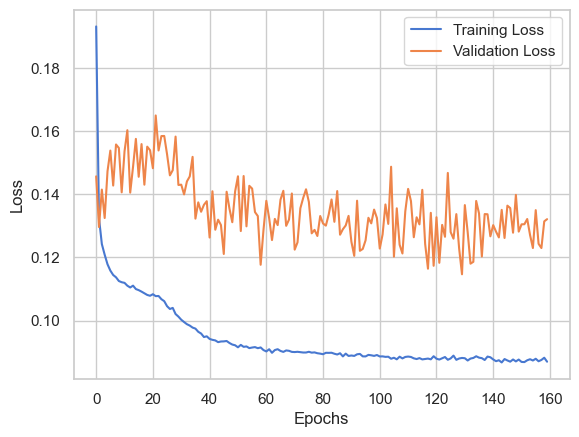

In [ ]:
# Plot the training and validation loss

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Evaluate the model on the test set and define the anomaly threshold

reconstruction_error = np.mean((autoencoder.predict(X_test) - X_test) ** 2, axis=1)
threshold = 3 * np.std(reconstruction_error)

1367/1367 [==============================] - 0s 315us/step


In [ ]:
# Identify anomalous sliding windows and gather their datetimes along with the reconstruction error metric

anomalies = []
for i, error in enumerate(reconstruction_error):
    if error > threshold:
        anomalies.append({
            'Datetime': test_windows[i].index[-1],
            'Anomaly': error
        })

anomalies_df = pd.DataFrame(anomalies)
anomalies_df.head(10)

,Datetime,Anomaly
0,2022-10-22 01:09:25,1.051929
1,2022-10-22 01:10:05,1.047179
2,2022-10-22 01:10:10,1.050060
3,2022-10-22 01:10:55,1.055290
4,2022-10-22 01:11:30,1.045285
5,2022-10-22 01:12:10,1.049401
6,2022-10-22 01:12:20,1.049247
7,2022-10-22 01:12:55,1.057619
8,2022-10-22 01:13:35,1.054643
9,2022-10-22 01:13:45,1.070656


In [ ]:
# Create a set of the anomaly datetimes for faster lookup
anomaly_datetimes = set(anomalies_df['Datetime'])

# Function to mark an observation as anomalous or not
def mark_anomaly(datetime):
    return datetime in anomaly_datetimes

# Create a new column 'Anomalous' in the hr_sleep DataFrame
hr_sleep['Anomalous'] = hr_sleep.index.map(mark_anomaly)

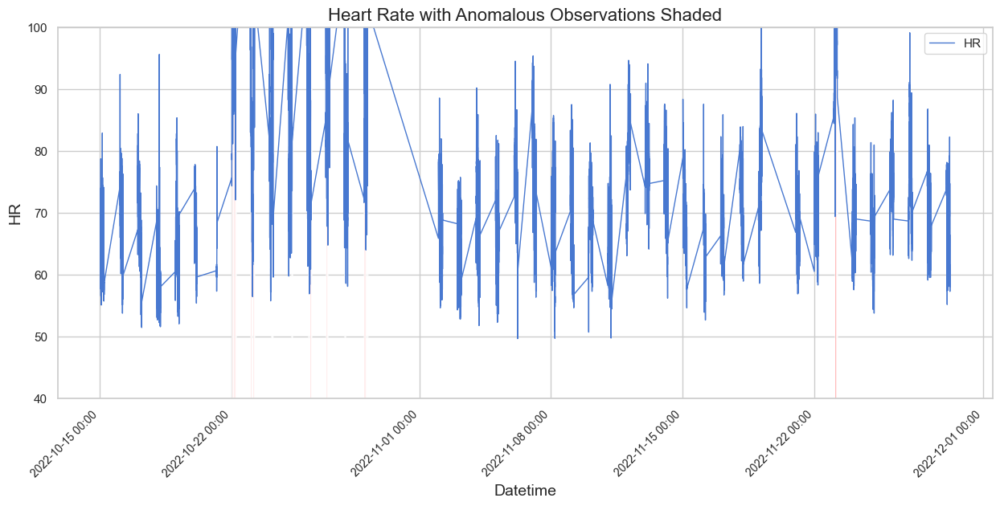

In [ ]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Filter the hr_sleep DataFrame to keep only the test dataset
test_hr_sleep = hr_sleep[hr_sleep.index >= datetime(2022, 10, 15)]

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(15, 6))

# Plot the HR values
ax.plot(test_hr_sleep.index, test_hr_sleep['HR'], label='HR', linewidth=1)

# Shade the anomalous observations
anomalous_regions = test_hr_sleep[test_hr_sleep['Anomalous']]
for anomalous_datetime in anomalous_regions.index:
    ax.axvspan(anomalous_datetime - pd.Timedelta(minutes=2.5), anomalous_datetime, facecolor='red', alpha=0.3)

# Set the title and labels
ax.set_title('Heart Rate with Anomalous Observations Shaded', fontsize=16)
ax.set_xlabel('Datetime', fontsize=14)
ax.set_ylabel('HR', fontsize=14)

# Format the x-axis ticks and labels
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(fontsize=10, rotation=45, ha='right')

# Set the y-axis range (optional, you can adjust the range according to your data)
ax.set_ylim(40, 100)

# Add a legend
ax.legend()

# Show the plot
plt.show()

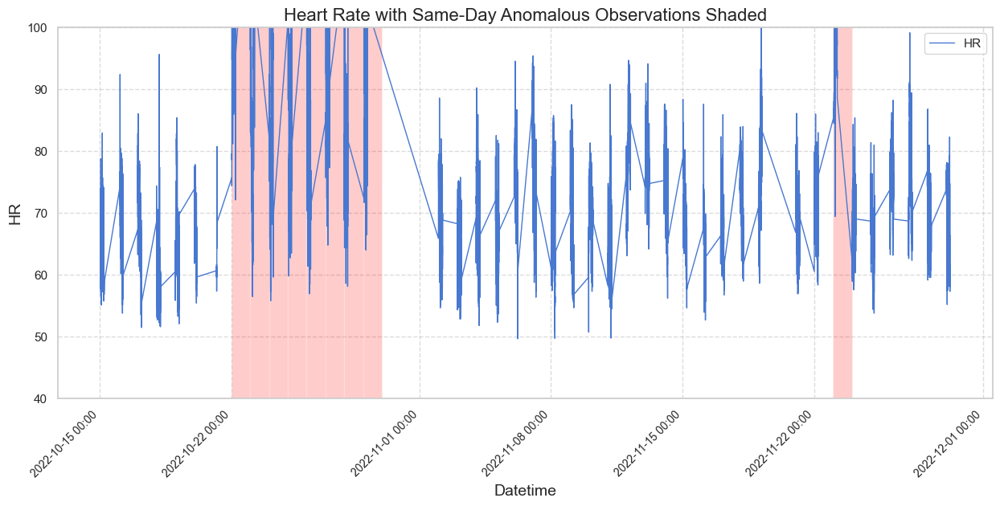

In [ ]:
# Create a set of dates with anomalous observations
anomalous_dates = set(anomalies_df['Datetime'].dt.date)

# Function to mark an observation as anomalous if it falls within the same day of an anomalous observation
def mark_anomaly_within_same_day(datetime):
    return datetime.date() in anomalous_dates

# Create a new column 'AnomalousWithinDay' in the hr_sleep DataFrame
hr_sleep['AnomalousWithinDay'] = hr_sleep.index.map(mark_anomaly_within_same_day)

# Filter the hr_sleep DataFrame to keep only the test dataset
test_hr_sleep = hr_sleep[hr_sleep.index >= datetime(2022, 10, 15)]

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(15, 6))

# Plot the HR values
ax.plot(test_hr_sleep.index, test_hr_sleep['HR'], label='HR', linewidth=1)

# Shade the observations falling within the same day of an anomalous observation
anomalous_regions = test_hr_sleep[test_hr_sleep['AnomalousWithinDay']]
for anomalous_date in anomalous_dates:
    start_datetime = pd.Timestamp(anomalous_date)
    end_datetime = start_datetime + pd.Timedelta(days=1)
    if start_datetime >= test_hr_sleep.index[0]:
        ax.axvspan(start_datetime, end_datetime, facecolor='red', alpha=0.2)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

# Set the title and labels
ax.set_title('Heart Rate with Same-Day Anomalous Observations Shaded', fontsize=16)
ax.set_xlabel('Datetime', fontsize=14)
ax.set_ylabel('HR', fontsize=14)

# Format the x-axis ticks and labels
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(fontsize=10, rotation=45, ha='right')

# Set the y-axis range (optional, you can adjust the range according to your data)
ax.set_ylim(40, 100)

# Add a legend
ax.legend()

# Show the plot
plt.show()


In [ ]:
# Let's evaluate the performance of an LSTM autoencoder and compare it with the basic autonecoder

from tensorflow.keras.layers import LSTM, RepeatVector, TimeDistributed

class LSTMAutoEncoder(Model):
    def __init__(self, output_units, timesteps, code_size=8):
        super().__init__()
        # Encoder
        self.encoder = Sequential([
            LSTM(64, activation='tanh', input_shape=(timesteps, output_units), return_sequences=True),
            Dropout(0.1),
            LSTM(32, activation='tanh', return_sequences=False),
            Dropout(0.1),
            Dense(code_size, activation='relu')
        ])
        # Decoder
        self.decoder = Sequential([
            RepeatVector(timesteps),
            LSTM(32, activation='tanh', return_sequences=True),
            Dropout(0.1),
            LSTM(64, activation='tanh', return_sequences=True),
            Dropout(0.1),
            TimeDistributed(Dense(output_units, activation='linear'))
        ])

    def call(self, inputs):
        encoded = self.encoder(inputs)
        decoded = self.decoder(encoded)
        return decoded


In [ ]:
# We need to reshape the input data to have the required 3D shape for the LSTM layers

X_train_3d = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val_3d = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)
X_test_3d = X_test.reshape(X_test.shape[0], X_test.shape[1], 1)

In [ ]:
timesteps = X_train_3d.shape[1]
output_units = 1

lstm_autoencoder = LSTMAutoEncoder(output_units, timesteps)
lstm_autoencoder.compile(optimizer=Adam(learning_rate=0.001), loss='mse')

# Train the LSTM autoencoder
history = lstm_autoencoder.fit(X_train_3d, X_train_3d, epochs=10, batch_size=256, validation_data=(X_val_3d, X_val_3d))

Epoch 1/10
212/212 [==============================] - 126s 583ms/step - loss: 0.2443 - val_loss: 0.1766
Epoch 2/10
212/212 [==============================] - 125s 588ms/step - loss: 0.1735 - val_loss: 0.1696
Epoch 3/10
212/212 [==============================] - 121s 571ms/step - loss: 0.1692 - val_loss: 0.1613
Epoch 4/10
212/212 [==============================] - 127s 602ms/step - loss: 0.1672 - val_loss: 0.1598
Epoch 5/10
212/212 [==============================] - 134s 631ms/step - loss: 0.1765 - val_loss: 0.1907
Epoch 6/10
212/212 [==============================] - 144s 677ms/step - loss: 0.1702 - val_loss: 0.1586
Epoch 7/10
212/212 [==============================] - 138s 650ms/step - loss: 0.1622 - val_loss: 0.1451
Epoch 8/10
212/212 [==============================] - 139s 657ms/step - loss: 0.1360 - val_loss: 0.1139
Epoch 9/10
212/212 [==============================] - 140s 662ms/step - loss: 0.1186 - val_loss: 0.1030
Epoch 10/10
212/212 [==============================] - 148s 699m

In [ ]:
history_2 = lstm_autoencoder.fit(X_train_3d, X_train_3d, epochs=5, batch_size=256, validation_data=(X_val_3d, X_val_3d))

Epoch 1/5
212/212 [==============================] - 147s 695ms/step - loss: 0.1066 - val_loss: 0.0938
Epoch 2/5
212/212 [==============================] - 141s 664ms/step - loss: 0.1490 - val_loss: 0.1527
Epoch 3/5
212/212 [==============================] - 143s 674ms/step - loss: 0.1350 - val_loss: 0.1104
Epoch 4/5
212/212 [==============================] - 145s 683ms/step - loss: 0.1078 - val_loss: 0.0990
Epoch 5/5
212/212 [==============================] - 143s 674ms/step - loss: 0.0964 - val_loss: 0.0883


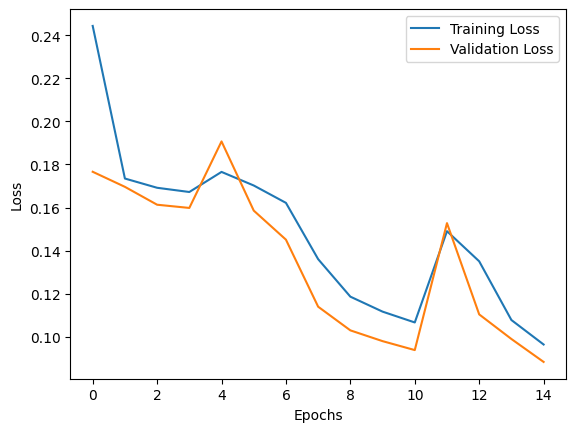

In [ ]:
# Plot the training and validation loss

plt.plot(history.history['loss'] + history_2.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'] + history_2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
# Evaluate the model on the test set and define the anomaly threshold

reconstruction_error_lstm = np.mean((lstm_autoencoder.predict(X_test_3d) - X_test_3d) ** 2, axis=1)
threshold = 3 * np.std(reconstruction_error_lstm)

1367/1367 [==============================] - 39s 28ms/step


In [ ]:
# Identify anomalous sliding windows and gather their datetimes along with the reconstruction error metric

anomalies_lstm = []
for i, error in enumerate(reconstruction_error_lstm):
    if error > threshold:
        anomalies_lstm.append({
            'Datetime': test_windows[i].index[-1],
            'Anomaly': error[0]
        })

anomalies_lstm_df = pd.DataFrame(anomalies_lstm)
anomalies_lstm_df.head(10)

,Datetime,Anomaly
0,2022-10-18 03:57:50,0.690451
1,2022-10-18 03:57:55,0.704076
2,2022-10-18 03:58:05,0.715459
3,2022-10-18 03:58:15,0.725454
4,2022-10-18 03:58:25,0.725783
5,2022-10-18 03:58:55,0.716969
6,2022-10-18 03:59:30,0.702340
7,2022-10-18 04:18:20,0.682091
8,2022-10-18 04:18:30,0.691539
9,2022-10-18 04:19:00,0.688717


In [ ]:
# Create a set of the anomaly datetimes for faster lookup
anomaly_datetimes = set(anomalies_lstm_df['Datetime'])

# Function to mark an observation as anomalous or not
def mark_anomaly(datetime):
    return datetime in anomaly_datetimes

# Create a new column 'Anomalous' in the hr_sleep DataFrame
hr_sleep['Anomalous'] = hr_sleep.index.map(mark_anomaly)

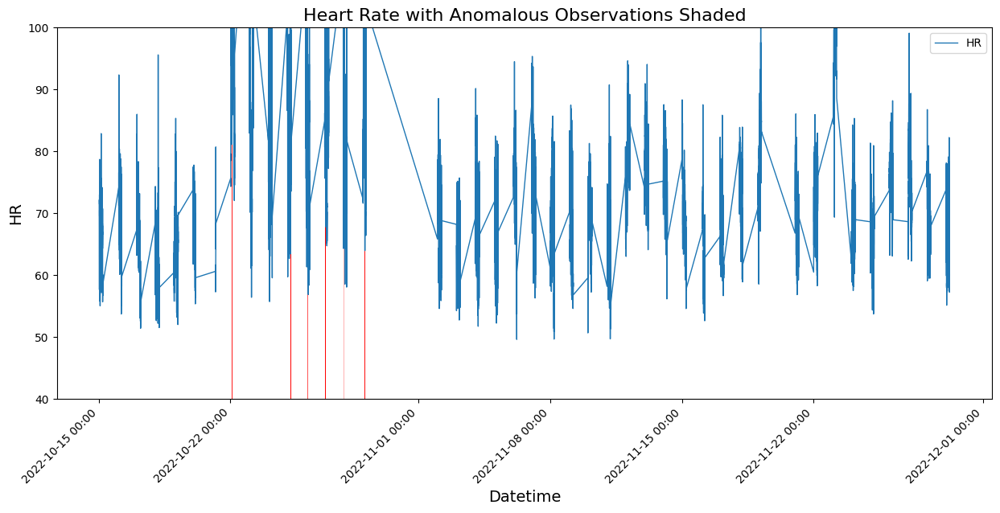

In [ ]:
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Filter the hr_sleep DataFrame to keep only the test dataset
test_hr_sleep = hr_sleep[hr_sleep.index >= datetime(2022, 10, 15)]

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(15, 6))

# Plot the HR values
ax.plot(test_hr_sleep.index, test_hr_sleep['HR'], label='HR', linewidth=1)

# Shade the anomalous observations
anomalous_regions = test_hr_sleep[test_hr_sleep['Anomalous']]
for anomalous_datetime in anomalous_regions.index:
    ax.axvspan(anomalous_datetime - pd.Timedelta(minutes=2.5), anomalous_datetime, facecolor='red', alpha=0.3)

# Set the title and labels
ax.set_title('Heart Rate with Anomalous Observations Shaded', fontsize=16)
ax.set_xlabel('Datetime', fontsize=14)
ax.set_ylabel('HR', fontsize=14)

# Format the x-axis ticks and labels
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(fontsize=10, rotation=45, ha='right')

# Set the y-axis range (optional, you can adjust the range according to your data)
ax.set_ylim(40, 100)

# Add a legend
ax.legend()

# Show the plot
plt.show()

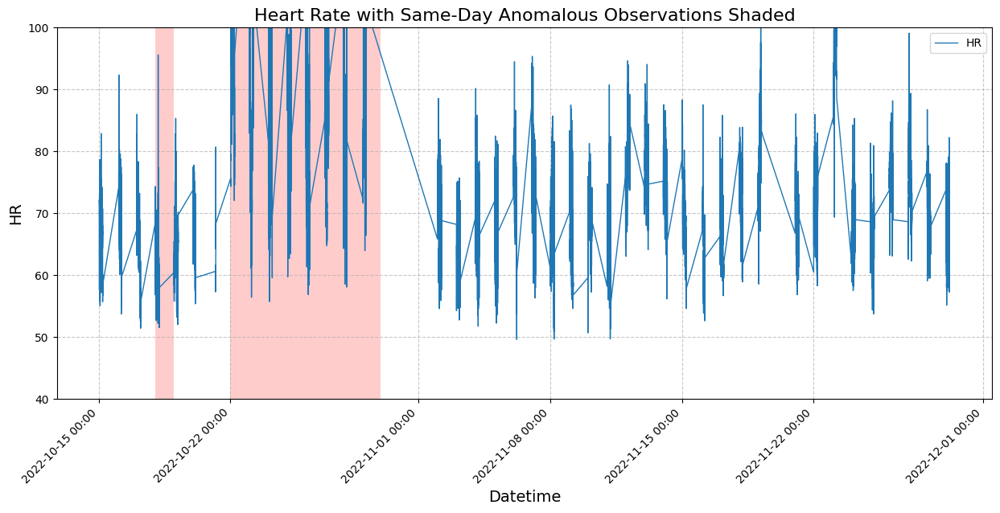

In [ ]:
# Create a set of dates with anomalous observations
anomalous_dates = set(anomalies_lstm_df['Datetime'].dt.date)

# Function to mark an observation as anomalous if it falls within the same day of an anomalous observation
def mark_anomaly_within_same_day(datetime):
    return datetime.date() in anomalous_dates

# Create a new column 'AnomalousWithinDay' in the hr_sleep DataFrame
hr_sleep['AnomalousWithinDay'] = hr_sleep.index.map(mark_anomaly_within_same_day)

# Filter the hr_sleep DataFrame to keep only the test dataset
test_hr_sleep = hr_sleep[hr_sleep.index >= datetime(2022, 10, 15)]

# Create a new figure and axis
fig, ax = plt.subplots(figsize=(15, 6))

# Plot the HR values
ax.plot(test_hr_sleep.index, test_hr_sleep['HR'], label='HR', linewidth=1)

# Shade the observations falling within the same day of an anomalous observation
anomalous_regions = test_hr_sleep[test_hr_sleep['AnomalousWithinDay']]
for anomalous_date in anomalous_dates:
    start_datetime = pd.Timestamp(anomalous_date)
    end_datetime = start_datetime + pd.Timedelta(days=1)
    if start_datetime >= test_hr_sleep.index[0]:
        ax.axvspan(start_datetime, end_datetime, facecolor='red', alpha=0.2)

# Add gridlines
ax.grid(True, linestyle='--', alpha=0.7)

# Set the title and labels
ax.set_title('Heart Rate with Same-Day Anomalous Observations Shaded', fontsize=16)
ax.set_xlabel('Datetime', fontsize=14)
ax.set_ylabel('HR', fontsize=14)

# Format the x-axis ticks and labels
ax.xaxis.set_major_locator(mdates.AutoDateLocator())
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M'))
plt.xticks(fontsize=10, rotation=45, ha='right')

# Set the y-axis range (optional, you can adjust the range according to your data)
ax.set_ylim(40, 100)

# Add a legend
ax.legend()

# Show the plot
plt.show()


### 4.2 Clustering de series deslizantes

In [ ]:
import numpy as np
import tsfresh
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from tsfresh.feature_extraction import feature_calculators

# Preprocess the data
def get_key_features_clustering(time_series):
    """
    This function computes a set of time-based, frequency-based, and time-frequency representation features
    from a time series using tsfresh library. The computed features are:
    - mean absolute change: the mean absolute difference between consecutive time series values
    - variance larger than standard deviation: ratio of variance to standard deviation, a measure of dispersion
    - coefficient of variation: the ratio of the standard deviation to the mean, a measure of variability
    - autocorrelation: the correlation of a time series with a delayed copy of itself
    - energy ratio by chunks: ratio of energy of the time series within each chunk of the series to the total energy of the series
    - spectral centroid: the weighted mean of the frequencies present in the spectrum, a measure of the "center of mass" of the frequencies 
      present in the time series.
    
    Parameters:
    time_series: np.array, the input time series
    
    Returns:
    np.array, the extracted features
    """
    # Converting to numpy array:
    time_series_array = time_series.values.flatten()

    # We compute the slope of the regression line
    x = np.arange(len(time_series_array))
    slope, _, _, _, _ = linregress(x, time_series_array)

    features = [
        time_series.mean()[0],
        time_series.std()[0],
        time_series.median()[0],
        slope,
        #feature_calculators.mean_abs_change(time_series.values),
        feature_calculators.number_crossing_m(time_series_array, time_series.median()[0]),
        #feature_calculators.variance_larger_than_standard_deviation(time_series.values),
        #feature_calculators.cid_ce(time_series.values, normalize=False),
        feature_calculators.autocorrelation(time_series_array, lag=1),
        feature_calculators.sample_entropy(time_series_array),
        feature_calculators.skewness(time_series_array),
        feature_calculators.abs_energy(time_series_array),
        #feature_calculators.energy_ratio_by_chunks(time_series.values, param=[{"num_segments": 10, "segment_focus": 1}]),  #num_segments=10
        #feature_calculators.fft_aggregated(time_series.values, param=[{"aggtype": "centroid"}]),
        time_series.index[-1]  # The datetime of the last observation of the sliding window should be the reference datetime for the feature vector
    ]
    return features


In [ ]:
# Segment the hr_sleep dataframe into sliding windows
sliding_windows = segment_time_series_with_sliding_windows(hr_sleep, 'HR', time_threshold)

In [ ]:
sliding_windows[0].values.flatten()

array([66.03847559, 67.        , 66.        , 65.        , 65.88759115,
       65.86364382, 65.89117746, 66.04749736, 66.12093018, 66.29394089,
       66.3915707 , 66.60420901, 68.        , 67.07172731, 67.31102266,
       67.42864526, 67.65497007, 67.76172421, 68.04458431, 68.12264516,
       68.24599886, 68.28837427, 69.        , 68.32078997, 68.29516263,
       67.69252358, 67.54075941, 70.        , 67.24655482, 67.1170982 ,
       66.90843658, 66.80595165, 66.22965169, 66.11314693, 66.02260154,
       64.        , 67.90662893, 67.84545415, 66.47489881, 66.33785966,
       63.        , 66.03380292, 66.16522759, 66.4095461 , 67.89472303,
       68.27372308, 69.05328677, 69.17705693, 69.14262365, 68.9338479 ,
       68.78059645, 68.42886817, 68.2501279 , 67.81314654, 67.73120271,
       67.98615572, 69.36329608, 70.52263734, 74.9381199 , 78.        ,
       85.        , 88.        , 87.        , 81.        , 76.        ,
       71.        , 65.68087239, 61.        , 60.        , 59.  

In [ ]:
# Step 2: Extract features for each sliding window
features = [get_key_features_clustering(window) for window in sliding_windows]
feature_df = pd.DataFrame(features, columns=['mean', 'std', 'median', 'slope', 'num_crossings', 'autocorrelation', 'sample_entropy', 'skewness', 'abs_energy', 'datetime'])  # , 'abs_energy'

In [ ]:
feature_df.head(3)

,mean,std,median,slope,num_crossings,autocorrelation,sample_entropy,skewness,abs_energy,datetime
0,68.823495,4.200289,68.285671,0.028517,17,0.859429,0.582250,1.946634,855759.209270,2022-06-03 00:57:20
1,68.923281,4.344631,68.291768,0.030793,17,0.879204,0.562651,1.931587,858454.129011,2022-06-03 00:57:25
2,68.978836,4.383661,68.302260,0.031923,17,0.897493,0.553885,1.877813,859894.129011,2022-06-03 00:57:30


In [ ]:
# Step 3: Drop sliding windows containing NaN or +/- Inf values
feature_df.replace([np.inf, -np.inf], np.nan, inplace=True)
feature_df.dropna(inplace=True)

In [ ]:
# Step 4: Standardize the features
scaler = StandardScaler()
scaled_features = scaler.fit_transform(feature_df.drop('datetime', axis=1))
scaled_feature_df = pd.DataFrame(scaled_features, columns=feature_df.columns[:-1])
scaled_feature_df['datetime'] = feature_df['datetime'].reset_index(drop=True)

In [ ]:
# Step 5: Separate the dataset into train and test sets
train_feature_df = scaled_feature_df[scaled_feature_df['datetime'] < datetime(2022, 10, 15)]
test_feature_df = scaled_feature_df[scaled_feature_df['datetime'] >= datetime(2022, 10, 15)]

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress 

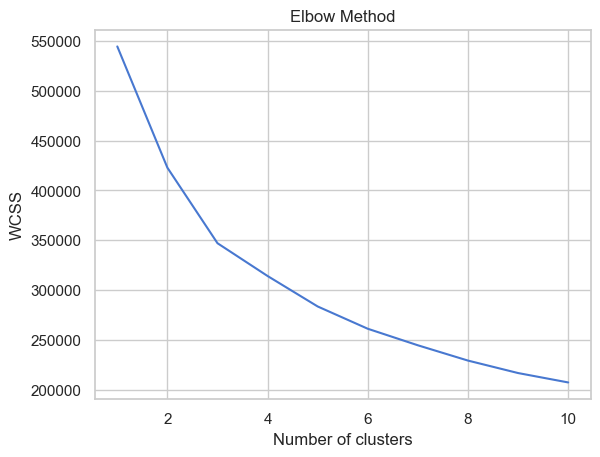

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Step 6a: Find the optimal number of clusters using the elbow method
wcss = []  # Within-cluster sum of squares
max_clusters = 10
for i in range(1, max_clusters+1):
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    kmeans.fit(train_feature_df.drop('datetime', axis=1))
    wcss.append(kmeans.inertia_)

plt.plot(range(1, max_clusters+1), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
# Determine the optimal number of clusters
optimal_clusters = 4

# Step 6b: Perform k-means clustering on the train set with the optimal number of clusters and assign clusters to the test vectors
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
train_clusters = kmeans.fit_predict(train_feature_df.drop('datetime', axis=1))
test_clusters = kmeans.predict(test_feature_df.drop('datetime', axis=1))

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
# Step 7: Print a table containing cluster centroids, silhouette scores, and the percentage of total observations in each cluster

from sklearn.metrics import silhouette_score

print("Cluster centroids:")
print(pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_)))
print()

train_silhouette_scores = silhouette_score(train_feature_df.drop('datetime', axis=1), train_clusters)
test_silhouette_scores = silhouette_score(test_feature_df.drop('datetime', axis=1), test_clusters)
print(f"Train silhouette score: {train_silhouette_scores}")
print(f"Test silhouette score: {test_silhouette_scores}")

train_cluster_counts = pd.value_counts(train_clusters, normalize=True) * 100
test_cluster_counts = pd.value_counts(test_clusters, normalize=True) * 100
print("\nPercentage of total observations in each cluster (Train):")
print(train_cluster_counts)
print("\nPercentage of total observations in each cluster (Test):")
print(test_cluster_counts)

Cluster centroids:
           0         1          2         3          4         5         6  \
0  79.846287  5.097529  79.968345 -0.005896  11.254962  0.926211  0.338195   
1  68.378482  2.878067  68.597644  0.002988  25.921877  0.759351  0.707326   
2  63.835902  3.778784  63.540545 -0.000734  11.878985  0.916349  0.339193   
3  59.464630  2.668623  58.972507 -0.003466  21.343765  0.721183  0.499138   

          7             8  
0 -0.143215  1.162759e+06  
1 -0.273240  8.476778e+05  
2  0.242240  7.408847e+05  
3  1.900192  6.406474e+05  

Train silhouette score: 0.19177378942811546
Test silhouette score: 0.1486273161143544

Percentage of total observations in each cluster (Train):
2    39.044462
1    24.874193
0    21.068912
3    15.012433
dtype: float64

Percentage of total observations in each cluster (Test):
0    39.144955
1    26.042501
2    25.159549
3     9.652995
dtype: float64


In [ ]:
from sklearn.metrics import silhouette_samples

# Assign clusters to train and test feature vectors
train_clusters = kmeans.predict(train_feature_df.drop('datetime', axis=1))
test_clusters = kmeans.predict(test_feature_df.drop('datetime', axis=1))

# Compute the silhouette coefficients for each sample in the train and test datasets
train_silhouette_values = silhouette_samples(train_feature_df.drop('datetime', axis=1), train_clusters)
test_silhouette_values = silhouette_samples(test_feature_df.drop('datetime', axis=1), test_clusters)

# Group silhouette coefficients by cluster and compute their average
train_silhouette_by_cluster = pd.DataFrame({'cluster': train_clusters, 'silhouette': train_silhouette_values}).groupby('cluster').mean()
test_silhouette_by_cluster = pd.DataFrame({'cluster': test_clusters, 'silhouette': test_silhouette_values}).groupby('cluster').mean()

print("Average silhouette coefficients for each cluster in the train dataset:")
print(train_silhouette_by_cluster)

print("\nAverage silhouette coefficients for each cluster in the test dataset:")
print(test_silhouette_by_cluster)


Average silhouette coefficients for each cluster in the train dataset:
         silhouette
cluster            
0          0.138326
1          0.215918
2          0.215679
3          0.164607

Average silhouette coefficients for each cluster in the test dataset:
         silhouette
cluster            
0          0.031574
1          0.219430
2          0.250908
3          0.165703


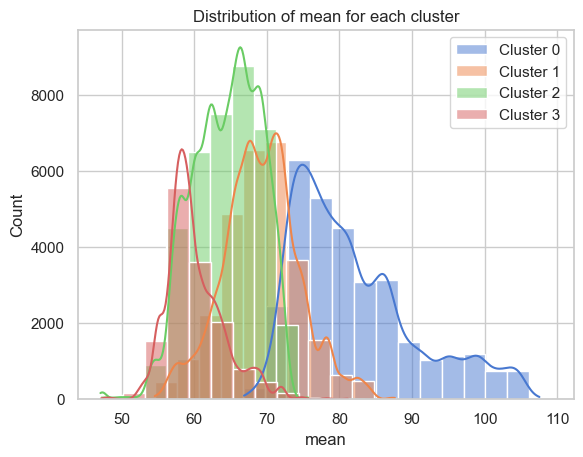

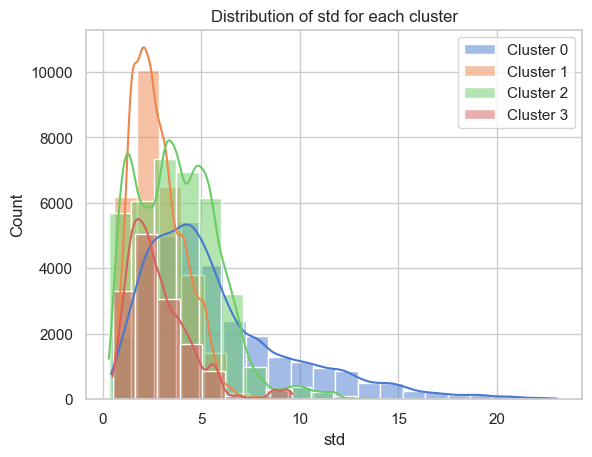

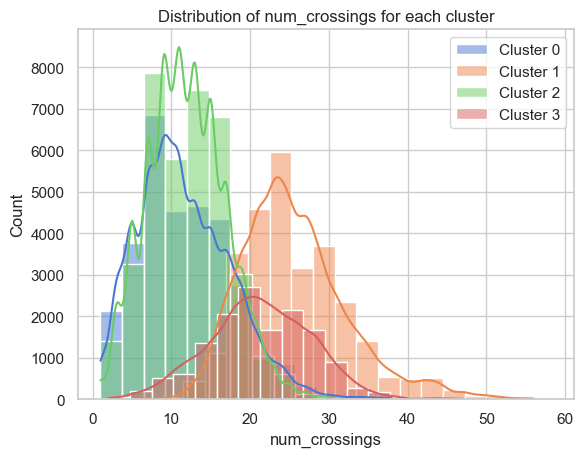

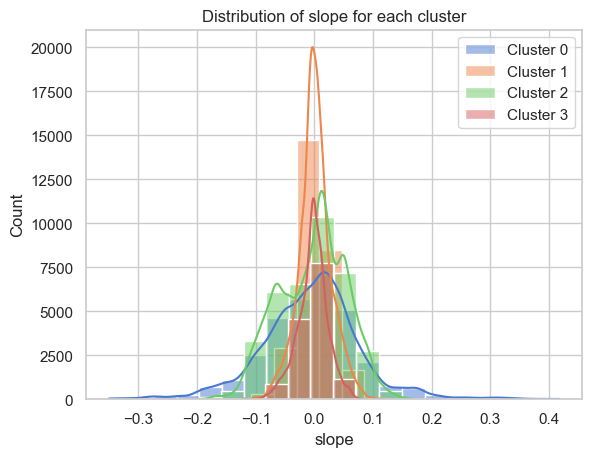

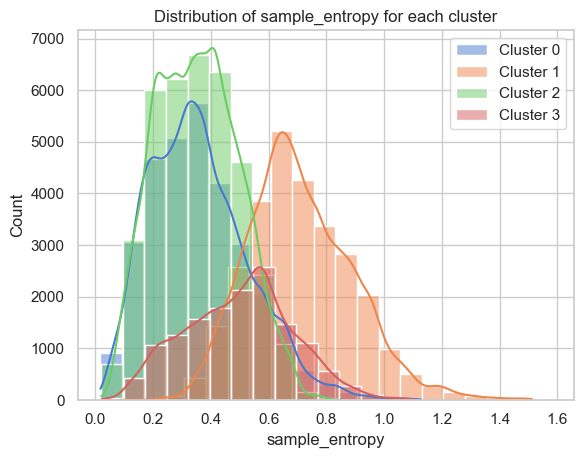

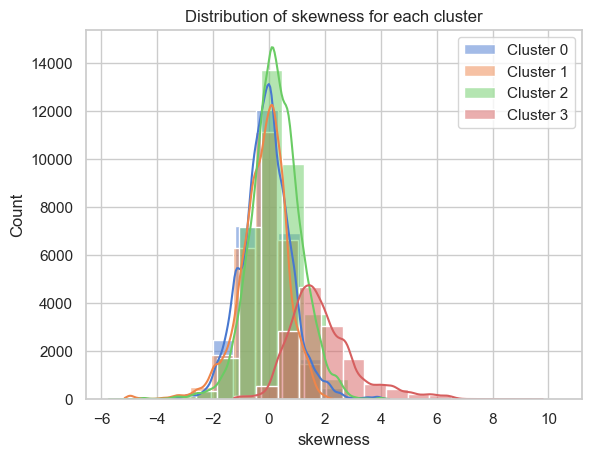

In [ ]:
import seaborn as sns

# Combine train and test features and cluster assignments
combined_features = pd.concat([train_feature_df, test_feature_df], axis=0)
combined_clusters = np.concatenate((train_clusters, test_clusters))
combined_features['cluster'] = combined_clusters

# Denormalize data
denormalized_data = scaler.inverse_transform(combined_features.drop(['datetime', 'cluster'], axis=1))
denormalized_data_df = pd.DataFrame(denormalized_data, columns=combined_features.drop(['datetime', 'cluster'], axis=1).columns)
denormalized_data_df['datetime'] = combined_features['datetime'].values
denormalized_data_df['cluster'] = combined_features['cluster'].values

# Define the columns to plot
columns_to_plot = [
    'mean',
    'std',
    'num_crossings',
    'slope',
    'sample_entropy',
    'skewness'
]

def calculate_binwidth(column, num_bins=10):
    min_value = denormalized_data_df[column].min()
    max_value = denormalized_data_df[column].max()
    return (max_value - min_value) / (2*num_bins)

# Plot the histograms
sns.set(style="whitegrid", palette="muted", color_codes=True)
for column in columns_to_plot:
    plt.figure()
    binwidth = calculate_binwidth(column)
    for i in range(optimal_clusters):
        cluster_data = denormalized_data_df[denormalized_data_df['cluster'] == i]
        sns.histplot(cluster_data[column], kde=True, color=sns.color_palette("muted")[i], label=f'Cluster {i}', binwidth=binwidth)
    plt.title(f'Distribution of {column} for each cluster')
    plt.legend()
    plt.show()


In [ ]:
# Finally, let's examine if this clustering can contribute to the anomaly detection.

# Step 1: Convert the anomalies_df datetime column to a DateTime object, if not already done
anomalies_df['Datetime'] = pd.to_datetime(anomalies_df['Datetime'])

# Step 2: Filter the test_feature_df to keep only the rows with datetimes that are in anomalies_df
anomaly_feature_df = test_feature_df[test_feature_df['datetime'].isin(anomalies_df['Datetime'])]

# Step 3: Assign clusters to the filtered anomaly feature vectors
anomaly_clusters = kmeans.predict(anomaly_feature_df.drop('datetime', axis=1))

# Step 4: Count the number of anomalies in each cluster and compute the percentage of total anomalies in each cluster
anomaly_cluster_counts = pd.value_counts(anomaly_clusters, normalize=True) * 100

print("Percentage of anomalies in each cluster:")
print(anomaly_cluster_counts)

Percentage of anomalies in each cluster:
0    100.0
dtype: float64


In [ ]:
# Merge the hr_sleep_hs dataset with the feature_vectors_df to include the cluster assignments
merged_df = combined_features.merge(hr_sleep_hs, how='left', left_on='datetime', right_index=True)

# Group the merged dataset by the clusters and hidden states
grouped_df = merged_df.groupby(['cluster', 'hidden_states']).size().reset_index(name='count')

# Count the number of observations in each group and compute the percentage of observations belonging to each hidden state within each cluster
total_counts = grouped_df.groupby('cluster')['count'].transform('sum')
grouped_df['percentage'] = (grouped_df['count'] / total_counts) * 100

# Pivot the dataframe to show the results in a more readable format
pivot_df = grouped_df.pivot_table(index='cluster', columns='hidden_states', values='percentage')
pivot_df.fillna(0, inplace=True)

print("Percentage of observations in each hidden state within each cluster for all data (train and test combined):")
print(pivot_df)


Percentage of observations in each hidden state within each cluster for all data (train and test combined):
hidden_states          0          1          2          3          4
cluster                                                             
0               2.449917   8.657650  38.968993  14.865382  35.058058
1              15.859672  26.139548   1.706218  38.214324  18.080238
2              38.706225  29.489820   0.569839  24.123171   7.110945
3              65.849753  24.033976   0.438627   8.041496   1.636148


In [ ]:
# Merge combined_features with hr_sleep_hs on the 'datetime' column
combined_features_copy = combined_features.copy(deep=True)
combined_features_copy = combined_features_copy.set_index('datetime')
merged_df = pd.merge(combined_features_copy, hr_sleep_hs['hidden_states'], left_index=True, right_index=True, how='left')

# Reset the index and sort the dataframe by 'datetime'
merged_df = merged_df.reset_index().sort_values('datetime')

# Merge the dataset with sleep on 'datetime' using the merge_asof() method to match each observation with the corresponding sleep stage
merged_df = pd.merge_asof(merged_df, sleep.reset_index(), left_on='datetime', right_on='start', direction='backward')

# Group the merged dataset by cluster and sleep stage
grouped_df = merged_df.groupby(['cluster', 'level']).size().reset_index(name='count')

# Count the number of observations in each group and compute the percentage of observations belonging to each sleep stage within each cluster
total_counts = grouped_df.groupby('cluster')['count'].transform('sum')
grouped_df['percentage'] = (grouped_df['count'] / total_counts) * 100

# Pivot the dataframe to show the results in a more readable format
pivot_df = grouped_df.pivot_table(index='cluster', columns='level', values='percentage')
pivot_df.fillna(0, inplace=True)

print("Percentage of observations in each sleep stage within each cluster:")
print(pivot_df)


Percentage of observations in each sleep stage within each cluster:
level      asleep       deep      light        rem      wake
cluster                                                     
0        0.405130  18.454128  58.488580  12.945004  9.707158
1        0.947111  14.713916  62.594445  15.739066  6.005463
2        0.000000  18.312421  62.973862  14.572353  4.141363
3        0.000000   8.187705  66.260531  15.957669  9.594096


### 4.3 Isolation forest

The isolation forest technique is an algorithm for data anomaly detection that was initially developed by Fei Tony Liu and Zhi-Hua Zhou in 2008¹. It detects anomalies using isolation, which means how far a data point is from the rest of the data¹. This method deviates from the mainstream philosophy that underpinned most existing anomaly detectors at the time, which usually rely on measuring the distance or density of the data points².

The theoretical foundations of the isolation forest technique are based on two assumptions²:

- Anomalies are the minority and have attribute-values that are very different from those of normal instances.
- Anomalies are more susceptible to isolation than normal instances.

The isolation forest technique works by creating an ensemble of binary decision trees, called isolation trees, that ``randomly split the data points in each node until they are isolated⁴``. The number of splits required to isolate a data point is called the path length, and it is used as a measure of anomaly score⁴. The shorter the path length, the more likely the data point is an anomaly⁴.

The isolation forest technique has some advantages over other anomaly detection methods, such as:

- It does not require any prior knowledge or assumptions about the data distribution¹.
- It can handle high-dimensional and mixed-type data¹.
- It has a low computational complexity and can scale well to large data sets¹.
- It can detect both global and local anomalies³.

(1) Isolation forest - Wikipedia. https://en.wikipedia.org/wiki/Isolation_forest Con acceso 14/2/2023.
(2) How to use the Isolation Forest model for outlier detection. https://practicaldatascience.co.uk/machine-learning/how-to-use-the-isolation-forest-model-for-outlier-detection Con acceso 14/2/2023.
(3) Isolation Forest | Anomaly Detection with Isolation Forest. https://www.analyticsvidhya.com/blog/2021/07/anomaly-detection-using-isolation-forest-a-complete-guide/ Con acceso 14/2/2023.
(4) An Alternative Exploitation of Isolation Forests for Outlier Detection .... https://link.springer.com/chapter/10.1007/978-3-030-73973-7_4 Con acceso 14/2/2023.

In [ ]:
# Importar las librerías necesarias
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

# Crear una instancia del modelo de aislamiento de bosques
# Puedes ajustar los parámetros según tus necesidades
iforest = IsolationForest(n_estimators=100, contamination=0.05, random_state=42)

# Entrenar el modelo con los datos de frecuencia cardíaca
iforest.fit(hr_sleep[["HR"]])

# Obtener las puntuaciones de anomalía y las etiquetas de predicción
scores = iforest.decision_function(hr_sleep[["HR"]])
labels = iforest.predict(hr_sleep[["HR"]])

# Añadir las puntuaciones y las etiquetas al dataframe
hr_sleep["score"] = scores
hr_sleep["label"] = labels

# Visualizar los resultados con plotly
fig = px.line(hr_sleep, x=hr_sleep.index, y="HR", color="label", title="Anomaly detection in HR data using Isolation Forest")
#fig.add_scatter(x=hr_sleep.index, y=hr_sleep["score"].tolist(), mode="lines", name="score")
fig.show()

/Users/alfonsoserrano-suner/Documents/Universidad/Quinto/TFG GITT/Proyecto Investigación/Caracterización HR y HRV/venv/lib/python3.10/site-packages/sklearn/base.py:409: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


: 

In [ ]:
# Isolation trees aplicado al dataframe de vectores de características

# Split the data into training and test sets
#train_df, test_df = train_test_split(ts_features_df, test_size=0.2, random_state=0)

train_df = ts_features_df[ts_features_df.index <= '2022-10-10']
test_df = ts_features_df[ts_features_df.index > '2022-10-10']

# Standardize the features
scaler = StandardScaler()
train_df_scaled = scaler.fit_transform(train_df)
test_df_scaled = scaler.transform(test_df)

# Crear una instancia del modelo de aislamiento de bosques
# Podemos ajustar los parámetros según necesidades
iforest = IsolationForest(n_estimators=300, contamination=0.05, random_state=42)

# Entrenar el modelo con los datos de frecuencia cardíaca
iforest.fit(train_df_scaled)

# Obtener las puntuaciones de anomalía y las etiquetas de predicción
scores = iforest.decision_function(train_df_scaled)
labels = iforest.predict(train_df_scaled)

# Añadir las puntuaciones y las etiquetas al dataframe
train_df["score"] = scores
train_df["label"] = labels

scores_test = iforest.decision_function(test_df_scaled)
labels_test = iforest.predict(test_df_scaled)
test_df["score"] = scores_test
test_df["label"] = labels_test

test_df.sort_index().head(45)

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_87938/664248964.py:26: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_87938/664248964.py:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/n5/q17mp4yj0fg4l0nnzg4h71_c0000gn/T/ipykernel_87938/664248964.py:31: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the d

,mean,Std Deviation,median,number of median crossings,autocorrelation,sample entropy,skewness,abs energy,score,label
datetime,,,,,,,,,,
2022-10-10 00:16:15,61.674303,5.061701,60.466073,1429,-0.494384,0.215208,0.738721,5481225.154052,0.181064,1
2022-10-12 00:48:05,66.781772,6.873508,66.761167,1129,-0.491935,0.34424,0.758732,5098584.133139,0.226864,1
2022-10-13 00:13:20,68.990468,4.907021,70.277965,1309,-0.496032,0.188665,0.731092,6268048.070862,0.191797,1
2022-10-14 00:22:30,59.557756,4.588258,57.699044,1249,-0.495218,0.185858,0.736828,4465044.321583,0.167972,1
2022-10-15 00:53:35,63.385801,5.433524,62.715919,995,-0.494154,0.254052,0.742532,4036131.803859,0.203856,1
2022-10-16 01:35:15,63.845013,6.85208,61.06549,879,-0.491014,0.28096,0.764326,3629213.104139,0.201255,1
2022-10-17 00:24:30,61.174089,5.952063,61.716162,1201,-0.491629,0.27896,0.751897,4541981.093171,0.205155,1
2022-10-18 00:19:30,59.974073,6.392326,58.773294,946,-0.491161,0.160695,0.77128,3445873.82835,0.178958,1
2022-10-18 05:13:15,84.143297,9.711302,79.779352,50,-0.489958,0.367304,0.777419,365851.804417,0.051713,1
